<div>
<img src="https://csdms.colorado.edu/csdms_wiki/images/ESPIn-mtns-skinny-transparent.png" width="800"/>
</div>

<div>
<img src="https://csdms.colorado.edu/csdms_wiki/images/thumb/CSDMS-logo-color-notagline-ver_high.png/400px-CSDMS-logo-color-notagline-ver_high.png" width="200" hspace="20"><a href="http://landlab.github.io"><img src="https://raw.githubusercontent.com/landlab/tutorials/release/landlab_header.png" width="500"></a>
</div>

# Post-Glacial Landscape Lab: Exploring the Dynamic Environments of Glacial Retreat 
<div>
<img src="media/KviarjokullOblique.jpg" width="600" hspace="20">
</div>
Kviarjokull System in Southeast Iceland

### Overview
This lab will introduce some of the key drivers of landscape change following deglaciation. It will walk the reader through the application of several components of the Landlab modeling ecosystem relevant to the system. The lab will develop familiarity with modeling 2D systems, including setting up gridded topography with subsurface ice (RasterModelGrid), and employing physics-based landscape modification components (LinearDiffuser, OverlandFlow, FlowDirectorSteepest, FlowAccumulator, SedDepEroder, ChannelProfiler, PriorityFloodFlowRouter, DepressionFinderAndRouter, Space). The final componant of the lab will be to simulate flow over real topography for the KviarJokull proglacial system in Southern Iceland, where Icelend's main cross country road crosses just at the foot.

### Time: 1-2 hrs

### Learning objectives
#### Skills
Running 2D numerical models in Landlab to simulate short term landscape evolution applicable to rapidly warming Arctic and alpine Environments.

#### Key concepts

* Paraglacial and periglacial processes
* Predicting outflow, erosion, sediment flux and vegetation dynamics of a deglaciated setting.

### Requirements
If you don't already have a JupyterHub account, follow the instructions to sign up at https://csdms.colorado.edu/wiki/JupyterHub. If you're an educator, you can get JupyterHub accounts for students--please contact us through the CSDMS Help Desk: https://csdms.github.io/help-desk.

If run locally, first download all the files from this repository and have conda installed on the local PC. Then, use the following commands to create a virtual environment and launch the Jupyter Notebook.

    $ cd 2025-postglacial-landscapes
    $ conda env create --file=environment.yml
    $ conda activate ivy
    $ jupyter notebook


### Contributors 
* Viet M Bui (organic rice fed - Delta & SLR dude)
* Ari Koeppel (sol3ling)
* Shayla Triantafillou (river gal)
* Karin Lehnigk (glof club)
* Lucille Baker-Stahl (temperature + morphodynamics = ?)
* Tom Hoseason (march of the triffids)

This lab was developed as part of the 2025 Earth Surface Processeses Institute (ESPIn) with support from the National Science Foundation under collaborative grants 1831623, 2026951, 2140831, 2104102, and 2148762.

# Table of Contents
* [Introduction](#Introduction)
Overview of relevance of lab to natural systems.

* [Step I. Setting up a Moraine Diffusion Model](#step-i-setting-up-a-moraine-diffusion-model)
See how simple manipulations affect erosion of permafrost and ice-cored sediment.

* [Step II. Setting up an Overland Flow Model](#step-ii-setting-up-an-overland-flow-model)
Practice building a function to model the effects of overland flow.

* [Step III. Sediment Transport](#step-iii-sediment-transport-coupling-diffusion-and-flow)
Practice building a function to model how sediment is transported in post-glacial systems.

* [Step IV. Vegetation and Erodibility](#step-iv-vegetation-and-erodibility)
Observe the dynamics of slope vegetation succession and how it evolves with erosive forces.

* [Step V. Combining the Elements](#step-v-combining-the-elements-into-a-scaled-model)
Combine all the elements together to track the landscape evolution of a postglacial system. This is first done over a synthetic landscape, and then over actual topographic data.

* [Summary and implications for our warming Arctic and alpine](#Summary)
Summary of the applicability and limitations of using a model like this.

## Introduction

Studying the dynamics of ice-cored moraines is essential for understanding how postglacial landscapes evolve. These landforms trap and slowly release glacial ice beneath a cover of sediment, which affects rates of meltwater production and sediment transport. As ice cores degrade, they can generate localized subsidence, alter drainage patterns, and increase sediment input into downstream channels. By measuring changes in surface morphology, ice volume, and melt rates, researchers can quantify sediment budgets and model the long-term development of glacial forefields, improving predictions of landscape adjustment following glacier retreat. 

Beyond landscape evolution, ice-cored moraine dynamics pose direct implications for hazard assessment and water resources. Rapid collapse of moraine ridges or sudden outbursts of trapped meltwater may trigger debris flows, floods, and infrastructure damage in downstream communities. Conversely, the slow release of water from buried ice contributes to seasonal streamflow, particularly in regions dependent on glacial melt for irrigation and hydropower. Detailed monitoring and numerical modeling of ice-cored moraines thus support both risk mitigation—through early warning of potential slope failures—and resource management under changing climate conditions. 

In [1]:
# packages for the model
from landlab.components import (
    LinearDiffuser, OverlandFlow, FlowDirectorSteepest, FlowAccumulator, DepthDependentTaylorDiffuser,
    SedDepEroder, ChannelProfiler, PriorityFloodFlowRouter, DepressionFinderAndRouter, Space
)
import numpy as np
import matplotlib.pyplot as plt
from landlab import RasterModelGrid, imshow_grid
from landlab.plot.graph import plot_graph
import matplotlib.pyplot as plt
from matplotlib import cm
import math
import pandas as pd
from matplotlib import animation
from IPython.display import HTML
from matplotlib.ticker import LinearLocator


## Step I. Setting up a Moraine Diffusion Model

### Generate Synthetic Idealized Moraine Topography
To model a erosional postglacial system, a key element is the presence of subsurface ice. Here, three layers are defined: Soil thickness, ice thickness, and a bottom bedrock surface.

In [2]:
class SyntheticMoraineTopography:
    """
    Class the idealized lateral moraine topography. 
    The topography is defined by a sine function for the ice elevation,
    a linear slope for the bedrock elevation, and a constant soil thickness.
    """
    def __init__(self, size_x=100, size_y=200, spacing=1.0):
        # insstanciate the grid
        self.size_x = size_x
        self.size_y = size_y
        self.spacing = spacing
        self.grid = RasterModelGrid((size_y, size_x), xy_spacing=spacing)
    
    def set_moraine_limits(self, ice_height=10, bedrock_slope=0.22, soil_thickness=5, moraine_disappears_at_y=100):
        """
        Set the parameters for the moraine topography.
        
        Parameters
        ----------
        ice_height : float
            The height of the ice surface.
        bedrock_slope : float
            The slope of the bedrock surface.
        soil_thickness : float
            The thickness of the soil layer.
        moraine_disappears_at_y : float
            The y-coordinate where the moraine disappears.
        """
        self.ice_height = ice_height
        self.bedrock_slope = bedrock_slope
        self.soil_thickness = soil_thickness
        self.moraine_disappears_at_y = moraine_disappears_at_y

        # add the topography    
        self.z_ice = self.grid.add_zeros('ice__elevation', at='node',clobber=True)
        self.z_soil = self.grid.add_zeros('soil__depth', at='node',clobber=True)
        self.z_bed = self.grid.add_zeros('bedrock__elevation', at='node',clobber=True)
        self.grid.add_zeros('topographic__elevation', at='node',clobber=True)

        # running the topography equation
        self.topography_equation()

    def topography_equation(self):
        x = self.grid.x_of_node
        y = self.grid.y_of_node

        # setting ice elevation respected to the base elevation
        self.z = self.ice_height * np.sin(np.pi*x / (self.size_x/3)) 
        # get z where y is less than moraine_disappears_at_y
        self.z[y<self.moraine_disappears_at_y] += (y[y<self.moraine_disappears_at_y] - self.moraine_disappears_at_y) * self.ice_height/self.moraine_disappears_at_y
        self.z[self.z<0] = 0 # cut the sine function at 0

        self.z_ice += self.z
        self.z_soil += self.soil_thickness

        self.z_bed += self.bedrock_slope * y

        # reassign the values to the grid just to be sure
        self.grid.at_node['ice__elevation'] = self.z_ice
        self.grid.at_node['soil__depth'][:] = self.z_soil
        self.grid.at_node['bedrock__elevation'] = self.z_bed + self.grid.at_node['ice__elevation']
        self.grid.at_node['topographic__elevation'][:] = self.grid.at_node['bedrock__elevation'] + self.grid.at_node['soil__depth']
    def reset(self):
        self.set_moraine_limits()

In [3]:
## Define the grid
size_x = 100
size_y = 200
spacing = 1.0

# morph the grid with a sine function
ice_height = 10 # meters
bedrock_slope = 0.22 # radians
soil_thickness = 5 # meters **PLAY WITH THIS**
moraine_disappears_at_y = 100 # meters

sm = SyntheticMoraineTopography(size_x, size_y, spacing)
sm.set_moraine_limits(ice_height, bedrock_slope, soil_thickness, moraine_disappears_at_y)

# add boundaries
sm.grid.status_at_node[sm.grid.nodes_at_left_edge] = sm.grid.BC_NODE_IS_CLOSED
sm.grid.status_at_node[sm.grid.nodes_at_right_edge] = sm.grid.BC_NODE_IS_CLOSED
# grid.status_at_node[grid.nodes_at_bottom_edge] = grid.BC_NODE_IS_CLOSED
sm.grid.status_at_node[sm.grid.nodes_at_top_edge] = sm.grid.BC_NODE_IS_CLOSED

### Visualization of each layer

Individual layers are plotted in 3D, demonstrating how together they sum to create surface topography.

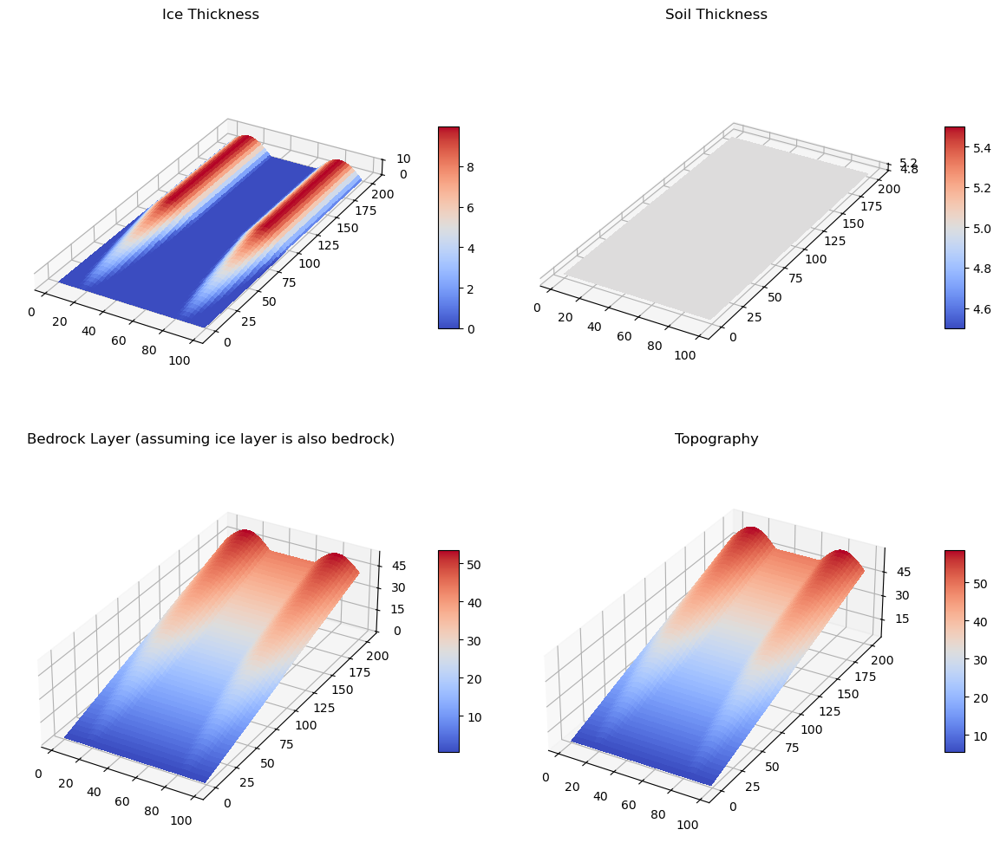

In [4]:
fig, axs = plt.subplots(2, 2, subplot_kw={"projection": "3d"}, figsize=(12, 10))

def plot_each_axs(axs,size_x,size_y,topo, title="Topography", nbins=5):
    X, Y = np.meshgrid(np.arange(0,size_x,spacing),np.arange(0,size_y,spacing))
    Z = topo.reshape(size_y, size_x)
    axs.set_box_aspect(aspect=(1, size_y/size_x, Z.max()/size_x))
    axs.plot_surface(X, Y, Z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
    axs.set_title(title)

    # Adjust z-axis ticks to make them readable
    axs.zaxis.set_major_locator(plt.MaxNLocator(nbins))  # Adjust the number of ticks
    axs.tick_params(axis='z', labelsize=10)  # Adjust the font size of z-axis labels

    cbar = fig.colorbar(axs.plot_surface(X, Y, Z, cmap=cm.coolwarm, linewidth=0, antialiased=False), ax=axs, shrink=0.5, aspect=10)

# Plot Ice Thickness
plot_each_axs(axs[0, 0], size_x, size_y, sm.grid.at_node['ice__elevation'], title="Ice Thickness", nbins=1)

# Plot Soil Thickness
plot_each_axs(axs[0, 1], size_x, size_y, sm.grid.at_node['soil__depth'], title="Soil Thickness", nbins=1)

# Plot Bedrock Layer
plot_each_axs(axs[1, 0], size_x, size_y, sm.grid.at_node['bedrock__elevation'], title="Bedrock Layer (assuming ice layer is also bedrock)")

# Plot Topography
plot_each_axs(axs[1, 1], size_x, size_y, sm.grid.at_node['topographic__elevation'], title="Topography")

# Adjust layout
plt.tight_layout()
plt.show()

### Define a Method That Thaws Ice as a Function of Overlying Sediment Thickness
Although we typically think of sediment as the mobile portion of topgraphy, ice trapped in moraines can lead to significant topographic changes over short time scales. This is caused by melting generating subsidence in overlying sediments and lowering the height of the surface. However, sediments insulate underlying ground ice. In order to realistically simulate thawing, we must turn thawing into a function of sediment this.

Following the data from Østrem (1959) and Nicholson and Benn (2006), a function is included to thaw massive ground ice. At sediment thicknesses below 5 cm, ice thaws at a rate of 6 cm/day. When sediment thickness exceeds 52 cm, thaw is fully inhibited.

Let's begin by initiating our new class. We can use a reasonable assumption of 100 thaw days per year and a timestep of one year in all of our following calculations.

In [5]:
class ThawIce:
    #define function and input a grid
    def __init__ (self, grid):
        self.grid = grid
    #calculate thaw rate in cm/day as a function of soil thickness
    def calc_thaw_rate(self, ice_thickness, soil_thickness): 
        self.ice_thickness = ice_thickness 
        self.soil_thickness = soil_thickness
        
        thaw_rate = []
        for i in range(len(self.soil_thickness)):
            if self.soil_thickness[i] <= 0.05: #m
                thaw_rate.append(0.06) #m/yr
            elif  0.05 < self.soil_thickness[i] < .517:
                thaw_rate.append(0.0857*self.soil_thickness[i])
            elif self.soil_thickness[i] >= .517:
                thaw_rate.append(0)
        self.thaw_rate = np.array(thaw_rate)
        #define thaw function and input numer of melt days per year and years to run the model
    def thaw(self, timestep_years, thaw_days_per_year):
        self.thaw_days = thaw_days_per_year
        self.dt = timestep_years
        for i in range(len(self.ice_thickness)-1):
            if self.ice_thickness[i] >= self.thaw_rate[i]*self.dt*self.thaw_days:
               self.ice_thickness[i] = self.ice_thickness[i] - self.dt*self.thaw_days*self.thaw_rate[i]
            else:
               self.ice_thickness[i] = 0

In [6]:
melt = ThawIce(sm.grid)

Before we actually begin thawing, let's visualize our initial ice thickness.

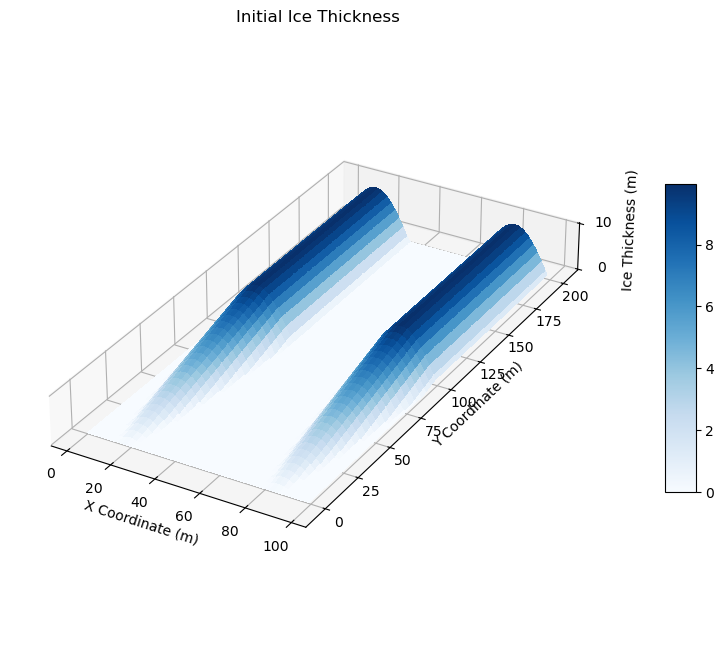

Notice, the maximum ice thickness underneath the moraines is 9.995065603657316 m


In [7]:
#3D plot the ice thickness

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(0, size_x, spacing), np.arange(0, size_y, spacing))
Z = sm.z_ice.reshape(size_y, size_x)

ax.set_box_aspect((1, size_y/size_x, 2*sm.z_ice.max()/size_x))  # Aspect ratio is 1:1:0.5
ax.zaxis.set_major_locator(plt.MaxNLocator(nbins=1))  # Adjust the number of ticks
ax.plot_surface(X, Y, Z, cmap='Blues', edgecolor='none')
ax.set_xlabel('X Coordinate (m)')
ax.set_ylabel('Y Coordinate (m)')
ax.set_zlabel('Ice Thickness (m)')
ax.set_title('Initial Ice Thickness')
fig.colorbar(ax.plot_surface(X, Y, Z, cmap='Blues', linewidth=0, antialiased=False), ax=ax, shrink=0.5, aspect=10)
plt.show()
print(f'Notice, the maximum ice thickness underneath the moraines is', max(sm.z_ice), 'm')

Now, let's thaw one timestep. To do this, we first call the calc_thaw_rate function then use the calculated thaw rate in the thaw function.

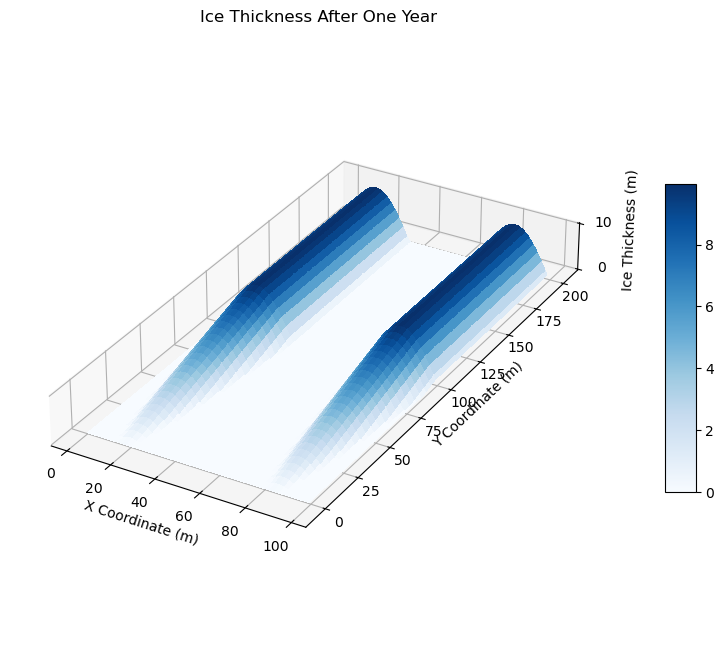

In [8]:
melt.calc_thaw_rate(ice_thickness = sm.z_ice, soil_thickness = sm.z_soil)
melt.thaw(timestep_years = 1, thaw_days_per_year = 100)

#3D plot the ice thickness

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(0, size_x, spacing), np.arange(0, size_y, spacing))
Z = sm.z_ice.reshape(size_y, size_x)

ax.set_box_aspect((1, size_y/size_x, 2*sm.z_ice.max()/size_x))  # Aspect ratio is 1:1:0.5
ax.zaxis.set_major_locator(plt.MaxNLocator(nbins=1))  # Adjust the number of ticks
ax.plot_surface(X, Y, Z, cmap='Blues', edgecolor='none')
ax.set_xlabel('X Coordinate (m)')
ax.set_ylabel('Y Coordinate (m)')
ax.set_zlabel('Ice Thickness (m)')
ax.set_title('Ice Thickness After One Year')
fig.colorbar(ax.plot_surface(X, Y, Z, cmap='Blues', linewidth=0, antialiased=False), ax=ax, shrink=0.5, aspect=10)
plt.show()

What Happened?
Did the ice thaw? No, it didn't. Why do you think that is? Why don't we examine the thaw rates to find out.

In [9]:
print(f'The maximum thaw rate is', max(melt.thaw_rate), 'cm/day')

The maximum thaw rate is 0 cm/day


Soil thickness is 5 m. This is much larger than the 0.517 m limit for soil thickness above which ice does not thaw. We set this limit because below this thickness of soil, ice is insolated from atmospheric warming and does not thaw.

However, because we want to investigate what happens when ice thaws, why don't we change soil thickness to 0.1 so ice begins to thaw.

In [10]:
def calc_elev(z_ice, z_soil, z_bed):
    elev = z_ice + z_soil + z_bed
    return elev

In [11]:
sm.z_soil -= 4.9
melt.calc_thaw_rate(ice_thickness = sm.z_ice, soil_thickness = sm.z_soil)
print(f'The thaw rate is now', max(melt.thaw_rate), 'cm/day')

The thaw rate is now 0.00856999999999997 cm/day


That looks more realistic. Why don't we thaw and plot the new ice thickness.

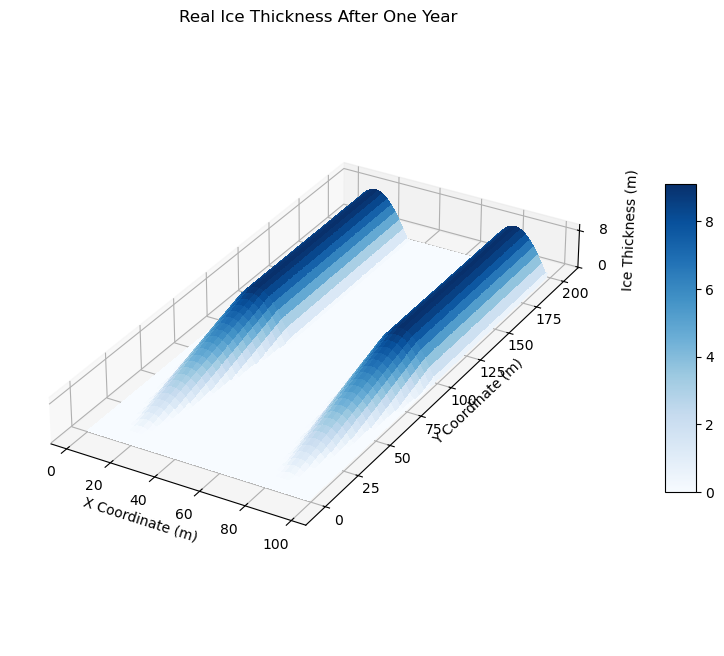

In [12]:
melt.thaw(timestep_years = 1, thaw_days_per_year = 100)

#3D plot the ice thickness
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(0, size_x, spacing), np.arange(0, size_y, spacing))
Z = melt.ice_thickness.reshape(size_y, size_x)

ax.set_box_aspect((1, size_y/size_x, 2*melt.ice_thickness.max()/size_x))  # Aspect ratio is 1:1:0.5
ax.zaxis.set_major_locator(plt.MaxNLocator(nbins=1))  # Adjust the number of ticks
ax.plot_surface(X, Y, Z, cmap='Blues', edgecolor='none')
ax.set_xlabel('X Coordinate (m)')
ax.set_ylabel('Y Coordinate (m)')
ax.set_zlabel('Ice Thickness (m)')
ax.set_title('Real Ice Thickness After One Year')
fig.colorbar(ax.plot_surface(X, Y, Z, cmap='Blues', linewidth=0, antialiased=False), ax=ax, shrink=0.5, aspect=10)

plt.show()

Not so different. However, if we call the maximum ice thickness, we get a different answer:

In [13]:
print(f'The maximum ice thickness is now', max(melt.ice_thickness), 'm. Before, it was 9.99 m')

The maximum ice thickness is now 9.138065603657319 m. Before, it was 9.99 m


It's now 9.13 m not 9.99 m! This means the ice has thawed.

Now why don't we continue and try thawing another 4 years.

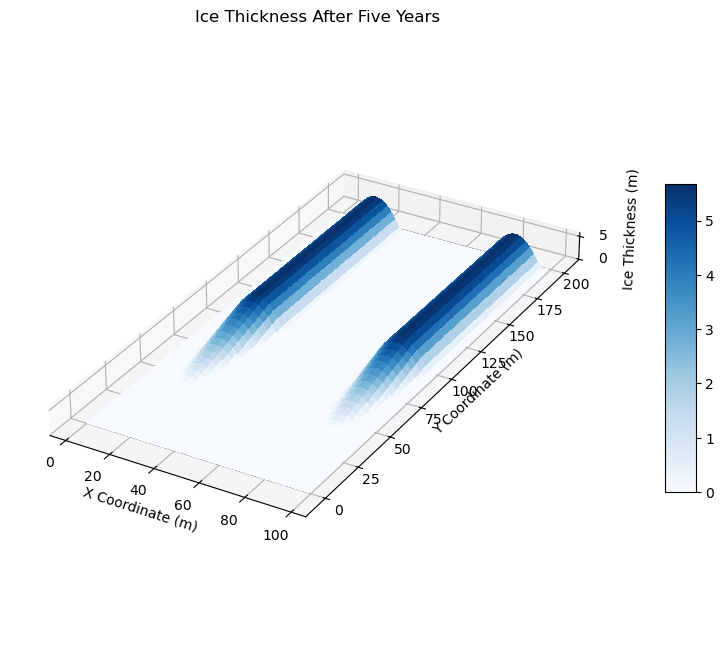

In [14]:
melt.calc_thaw_rate(ice_thickness = sm.z_ice, soil_thickness = sm.z_soil)
melt.thaw(timestep_years = 4, thaw_days_per_year = 100)
#3D plot the ice thickness
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(0, size_x, spacing), np.arange(0, size_y, spacing))
Z = melt.ice_thickness.reshape(size_y, size_x)

ax.set_box_aspect((1, size_y/size_x, 2*melt.ice_thickness.max()/size_x))  # Aspect ratio is 1:1:0.5
ax.zaxis.set_major_locator(plt.MaxNLocator(nbins=1))  # Adjust the number of ticks

ax.plot_surface(X, Y, Z, cmap='Blues', edgecolor='none')
ax.set_xlabel('X Coordinate (m)')
ax.set_ylabel('Y Coordinate (m)')
ax.set_zlabel('Ice Thickness (m)')
ax.set_title('Ice Thickness After Five Years')
fig.colorbar(ax.plot_surface(X, Y, Z, cmap='Blues', linewidth=0, antialiased=False), ax=ax, shrink=0.5, aspect=10)

plt.show()

Notice the ice has retreated and thinned.

Now let's run another 10 years. That will put us at 10 years total of thawing. 

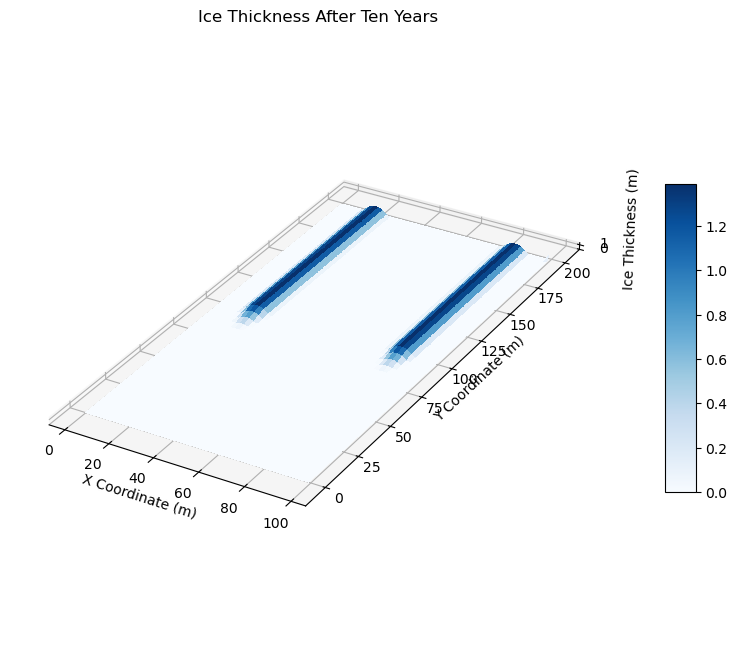

In [15]:
melt.thaw(timestep_years = 5, thaw_days_per_year = 100)
#3D plot the ice thickness
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(0, size_x, spacing), np.arange(0, size_y, spacing))
Z = melt.ice_thickness.reshape(size_y, size_x)

ax.set_box_aspect((1, size_y/size_x, 2*melt.ice_thickness.max()/size_x))  # Aspect ratio is 1:1:0.5
ax.zaxis.set_major_locator(plt.MaxNLocator(nbins=1))
ax.plot_surface(X, Y, Z, cmap='Blues', edgecolor='none')
ax.set_xlabel('X Coordinate (m)')
ax.set_ylabel('Y Coordinate (m)')
ax.set_zlabel('Ice Thickness (m)')
ax.set_title('Ice Thickness After Ten Years')
fig.colorbar(ax.plot_surface(X, Y, Z, cmap='Blues', linewidth=0, antialiased=False), ax=ax, shrink=0.5, aspect=10)

plt.show()

You can see how the ice continues to retreat! Let's now examine the final topography after 10 years of thawing.

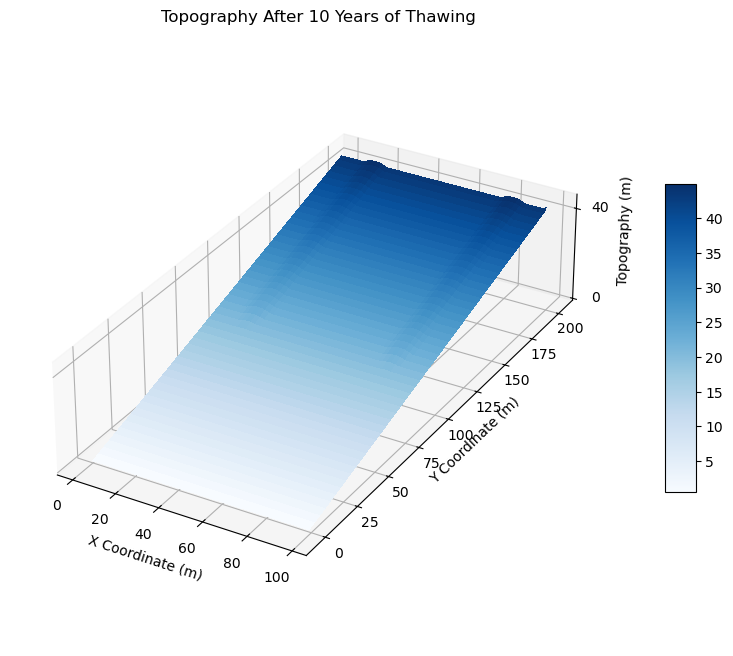

In [16]:
elev = calc_elev(melt.ice_thickness, sm.z_soil, sm.z_bed)
#3D plot the topography
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(0, size_x, spacing), np.arange(0, size_y, spacing))
Z = elev.reshape(size_y, size_x)

ax.set_box_aspect((1, size_y/size_x, elev.max()/size_x))  # Aspect ratio is 1:1:0.5
ax.zaxis.set_major_locator(plt.MaxNLocator(nbins=1))
ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')
ax.set_xlabel('X Coordinate (m)')
ax.set_ylabel('Y Coordinate (m)')
ax.set_zlabel('Topography (m)')
ax.set_title('Topography After 10 Years of Thawing')
fig.colorbar(ax.plot_surface(X, Y, Z, cmap='Blues', linewidth=0, antialiased=False), ax=ax, shrink=0.5, aspect=10)

plt.show()

Now the topography has mostly flattened only due to ice thawing.
In order to procede with the future modules we have to reset the synthetic topography

##### Now we have to reset the topograhy for ice

In [17]:
sm.reset()

#### Soil Diffusion Model
Soil on steep slopes such as moraines is typically unstable. In order to simulate this, we must diffuse the soil over time. This section explores how we can use depth dependant diffusion to mobilize soil. 

In order to use our depth dependant diffuser, we must first define a soil production rates. In typical landscapes, this would be a function of climate, vegetation and available weathered bedrock. However, in a recently deglaciated landscape, we can call this zero.

In [18]:
soil_production = sm.grid.add_zeros('soil_production__rate', at = 'node', clobber=True)

Now, we can create a depth dependant soil diffusion function. Remember our initial soil layer was 5m thick. What do you expect will happen if we diffuse it for a year? Why don't we find out.

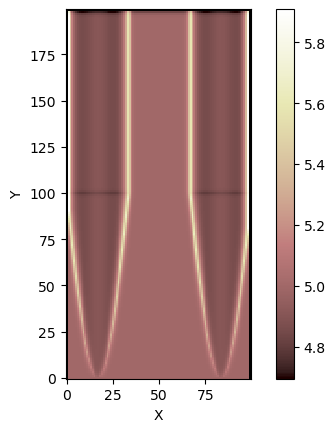

In [19]:
DDdiff = DepthDependentTaylorDiffuser(sm.grid, if_unstable="warn", dynamic_dt=True)
DDdiff.run_one_step(1)
sm.grid.imshow(sm.grid.at_node['soil__depth'], )

Is this what you expected? Notice that soil thickness decreased on top of the moraines and increases at their base. Now that we know what to expect, why don't we try diffusing for 10 years.

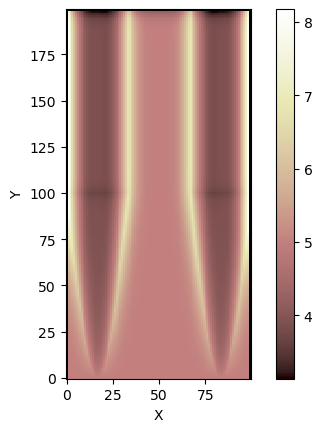

In [20]:
DDdiff.run_one_step(10)
sm.grid.imshow(sm.grid.at_node['soil__depth'])

Similar pattern but with increasing disparities between where soil is thicker and thinner. Notice also how thickness is decreasing most near the top of the model. This is because this area is the highest elevation. Why don't we confirm that by plotting the elevation now. 

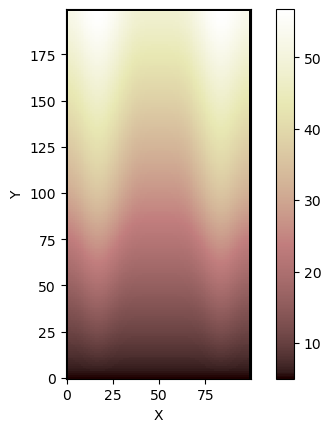

In [21]:
sm.grid.imshow(sm.grid.at_node['topographic__elevation'])

What about topography after 100 years?

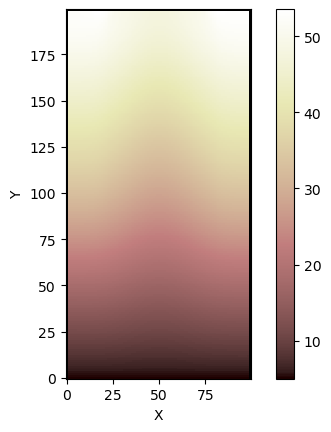

In [22]:
DDdiff.run_one_step(89)
sm.grid.imshow(sm.grid.at_node['topographic__elevation'])

Notice how just like with the thawing ice, topography is flattened.

##### Now we have to reset the topograhy

In [23]:
sm.reset()

## Step II. Setting up an Overland Flow Model

Newly exposed surfaces in proglacial basins often experience overland flow as well-defined channels have yet to form. This section explores where flow is likely to occur through time. Ulitmately, this section defines the water source for fluvial tansport in the next section.

#### Make necessary adjustments to grid to facilitate flow

In [24]:
# set constant random seed for consistent topographic roughness
np.random.seed(seed=5000)

# impose topography values on model grid
sm.grid.at_node['topographic__elevation'] += np.random.uniform(0.0, 1.0, size=sm.grid.at_node['topographic__elevation'].shape)
# add boundaries for the ridge of the moraine
# grid.status_at_node[grid.x_of_node < (100/6)] = grid.BC_NODE_IS_CLOSED
# grid.status_at_node[grid.x_of_node > (100-100/6)] = grid.BC_NODE_IS_CLOSED

# Set lower-edge as an open boundary
sm.grid.set_watershed_boundary_condition_outlet_id(
    50 , sm.grid.at_node["topographic__elevation"], -9999.0
)

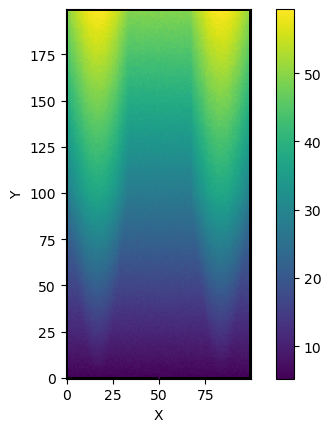

In [25]:
sm.grid.imshow(sm.grid.at_node['topographic__elevation'], cmap='viridis', color_for_background='lightgrey')

#### Assign key parameters

In [26]:
# ChannelProfiler parameters
number_of_watersheds = 1
minimum_channel_threshold=100
# PriorityFloodFLowRouter parameters
flow_metric = "D8"
phi_FR = 0.0
debris_thickness_rate = 0.08 # m/yr
# OVERLAND FLOW parameters
# We establish the channel width & upstream position on the grid
channel_w = 20. # set channel width, meters (PLAY WITH THIS VALUE!!)
channel_center = size_x/(2 * spacing)
# print(channel_center)
channel_diff = channel_w/2


num_nodes = size_x * size_y / spacing - 1
node_channel_left = int(num_nodes - channel_center - channel_diff)-size_x
node_channel_right = int(num_nodes - channel_center + channel_diff)-size_x

# We set fixed boundary conditions, specifying the nodes and links in which the water is flowing into the grid
inlet_nodes = np.arange(math.floor(node_channel_left), math.ceil(node_channel_right), spacing).astype(int)

# We set the fixed values in the entry nodes/links
# constant_Q = 10000. # discharge value; m3/s (PLAY WITH THIS VALUE!!)
constant_Q_m3ps = 100. # stream discharge value; m3/s (PLAY WITH THIS VALUE!!)
sec_per_year = 60*60*24*365 # s/yr
constant_Q = constant_Q_m3ps * sec_per_year # discharge in m3/yr

Q_array = np.ones(len(inlet_nodes)) * constant_Q

# We establish the initial conditions for depth (empty)
h = sm.grid.add_zeros("surface_water__depth", at="node", clobber=True)

# Water velocity is zero in everywhere since there is no water yet
vel = sm.grid.add_zeros("surface_water__velocity", at="link", clobber=True)

# Calculating the initial water surface elevation from water depth and topographic elevation
wse = sm.grid.add_field("surface_water__elevation", sm.grid.at_node['topographic__elevation'], at="node", clobber=True)

# We set some other values
mannings_n = 0.05 # Mannings roughness
# dt = 50 # Timestep; this is probably defined above/elsewhere

#### Set up modeling elements

In [27]:
# Instantiate the OverlandFlow component to work on this grid and run it
of = OverlandFlow(sm.grid, steep_slopes=True)

# Instantiate the ThawIce component to work on this grid and run it
# ti = ThawIce(ice_thickness=grid.at_node['ice__elevation'])

# Instantiate flow router
fr = FlowAccumulator(sm.grid, flow_director="FlowDirectorD8")

# Instantiate depression finder and router; optional
df = DepressionFinderAndRouter(sm.grid)

No outputs shown here. Results are coupled with sediment transport below.

## Step III. Sediment Transport

Ultimately, flow desplaces sediment and begins to channelize. With this process, downstream sediment flux increases dramatically.

#### Assign key parameters

In [28]:
# Set model timestep
timestep = 1  # years
# Set elapsed time to zero
elapsed_time = 0.0  # years
# Set timestep count to zero
count = 0
# Set model run time
run_time = 100  # years
# Array to save sediment flux values
sed_flux = np.zeros(int(run_time // timestep))  # Adjusted size
node_next_to_outlet = 151

# Instantiate SPACE model with chosen parameters
sp = Space(
    sm.grid,
    K_sed=0.01, # Sediment erodibility, Governs the rate of sediment entrainment; may be specified as a single floating point number, an array of length equal to the number of grid nodes, or a string naming an existing grid field.
    K_br=0.00001, # Bedrock erodibility, Governs the rate of bedrock erosion; may be specified as a single floating point number, an array of length equal to the number of grid nodes, or a string naming an existing grid field.
    F_f=0.0, # Fraction of fine sediment, (unitless, 0-1) fraction of rock that does not get converted to sediment but assumed to exit model domain as wash load
    phi=0.0, # Sediment porosity
    H_star=1.0, # Sediment entrainment length scale - think of reflecting bedrock surface roughness
    v_s=5.0, # Effective settling velocity
    m_sp=0.5, # Stream power exponent on drainage area or discharge in the stream power framework. Generally 0.5
    n_sp=1.0, # Stream power exponent n  on channel slope around 1
    sp_crit_sed=0, 
    sp_crit_br=0,
)


# Give the downward component of each inlet node a discharge corresponding to constant_Q
for n in inlet_nodes:
    links = sm.grid.links_at_node[n]  #links pointing dow
    sm.grid.at_link["surface_water__discharge"][links[3]] = constant_Q

# Set up the discharge as a function of time
discharge_list = np.arange(constant_Q, 0.556*(run_time+1) + constant_Q, 0.556*timestep)

#### Define descrete bundles of sediment accessible for transport
Based on concept from Woerkom et al., 2019 that postglacial landscape has erodible mounds.

In [29]:
# Method 1: Parabolic circular mounds | cred: Susannah 
def create_parabolic_mound(x_center, y_center, radius, depth_peak):
    """Create a parabolic soil mound with specified radius and peak depth"""
    # Calculate distance from center for all nodes
    distance = np.sqrt((sm.grid.x_of_node - x_center)**2 + (sm.grid.y_of_node - y_center)**2)
    # Create parabolic profile: depth = peak * (1 - (distance/radius)^2)
    # Only apply within the specified radius
    normalized_distance = distance / radius
    # Create mask for nodes within the mound
    within_mound = distance <= radius
    # Calculate parabolic depth (only for nodes within radius)
    parabolic_factor = np.zeros_like(distance)
    parabolic_factor[within_mound] = 1 - normalized_distance[within_mound]**2
    # Ensure no negative values
    parabolic_factor = np.maximum(parabolic_factor, 0)
    # Calculate depth to add
    depth_to_add = depth_peak * parabolic_factor
    # Add the new depth to existing soil depth
    sm.grid.at_node["soil__depth"] += depth_to_add
    return 


#### Simulate sediment transport

In [30]:

while elapsed_time < run_time:  # Changed condition
    # Run the flow router
    fr.run_one_step()

    # Run the depression finder and router
    df.map_depressions()

    # Run SPACE for one time step
    sp.run_one_step(dt=timestep)

    of.run_one_step()
    for n in inlet_nodes:
        links = sm.grid.links_at_node[n]  #links pointing down
        sm.grid.at_link["surface_water__discharge"][links[3]] = discharge_list[count+1]

    # Save sediment flux value to array
    sed_flux[count] = sm.grid.at_node["sediment__flux"][node_next_to_outlet]

    # grid.at_node["soil__depth"] += timestep * debris_thickness_rate
    create_parabolic_mound(
        x_center=np.random.uniform(30, 50), 
        y_center=np.random.uniform(125, 199), 
        radius=np.random.uniform(1,20), 
        depth_peak=np.random.uniform(0.01,0.08)
    )
    create_parabolic_mound(
        x_center=np.random.uniform(50, 70), 
        y_center=np.random.uniform(125, 199), 
        radius=np.random.uniform(1,20), 
        depth_peak=np.random.uniform(0.01,0.08)
    )
    # create_parabolic_mound(x_center=60, y_center=190, radius=10, depth_peak=0.08)
    # thaw the ice
    # ti.thaw(thaw_rate=0.01, dt=timestep)  # Thaw rate in m/yr
    # Update the ice thickness in the grid
    # grid.at_node["ice_thickness"] = ti.ice_thickness

    # Add to value of elapsed time
    elapsed_time += timestep

    # Increase timestep count
    count += 1
    # Print progress
    # print(f"Elapsed time: {elapsed_time:.2f} years, Sediment flux: {sed_flux[count-1]:.2f} m^3/yr")

#### Plot landscape evolution due to fluvial sediment transport

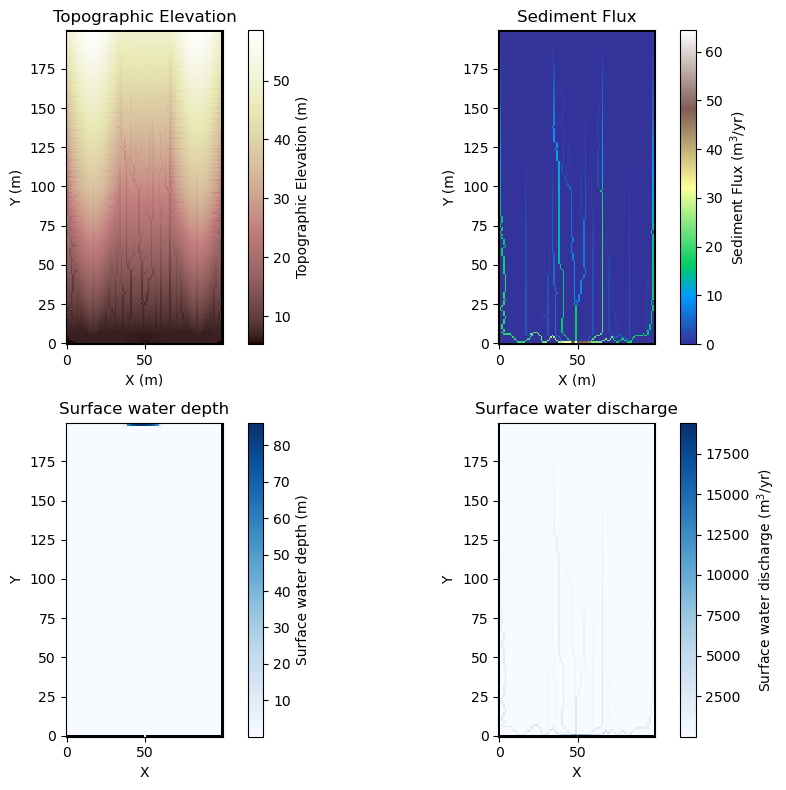

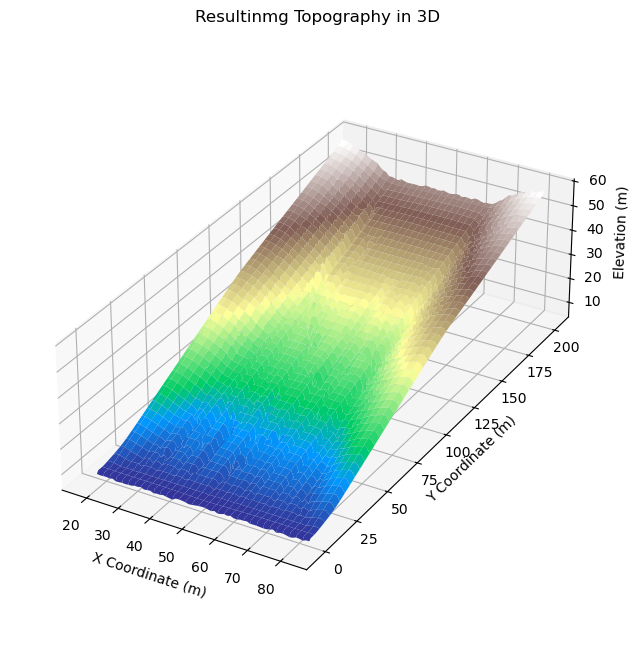

In [31]:

# Create a figure with 1 row and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Plot topographic elevation in the first subplot
plt.sca(axes[0,0])  # Set the current axis to the first subplot
imshow_grid(
    sm.grid,
    "topographic__elevation",
    plot_name="Topographic Elevation",
    var_name="Topographic Elevation",
    var_units="m",
    grid_units=("m", "m"),
    color_for_closed='black',
)

# Plot sediment flux in the second subplot
plt.sca(axes[0,1])  # Set the current axis to the second subplot
imshow_grid(
    sm.grid,
    "sediment__flux",
    plot_name="Sediment Flux",
    var_name="Sediment Flux",
    var_units=r"m$^3$/yr",
    grid_units=("m", "m"),
    cmap="terrain",
)

plt.sca(axes[1,0])  # Set the current axis to the third subplot
imshow_grid(
    sm.grid,
    'surface_water__depth',
    plot_name="Surface water depth",
    var_name="Surface water depth",
    cmap="Blues",
    var_units="m",
)
plt.sca(axes[1,1])  # Set the current axis to the third subplot
imshow_grid(
    of.grid,
    'surface_water__discharge',
    plot_name="Surface water discharge",
    var_name="Surface water discharge",
    cmap="Blues",
    var_units="m$^3$/yr",
)

plt.tight_layout()
plt.show()

#3D plot the topography
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(0, size_x, spacing), np.arange(0, size_y, spacing))
Z = sm.grid.at_node['topographic__elevation'].reshape(size_y, size_x)

# Limit the x domain from 33.33 to 66.67
x_mask = (X[0, :] >= 16.67) & (X[0, :] <= 83.33)
X = X[:, x_mask]
Y = Y[:, x_mask]
Z = Z[:, x_mask]
ax.set_box_aspect((1, size_y/size_x, sm.grid.at_node['topographic__elevation'].max()/size_x))  # Aspect ratio is 1:1:0.5
ax.plot_surface(X, Y, Z, cmap='terrain', edgecolor='none')
ax.set_xlabel('X Coordinate (m)')
ax.set_ylabel('Y Coordinate (m)')
ax.set_zlabel('Elevation (m)')
ax.set_title('Resultinmg Topography in 3D')
plt.show()

#### Plot a quantification of sediment flux and deposition in profile

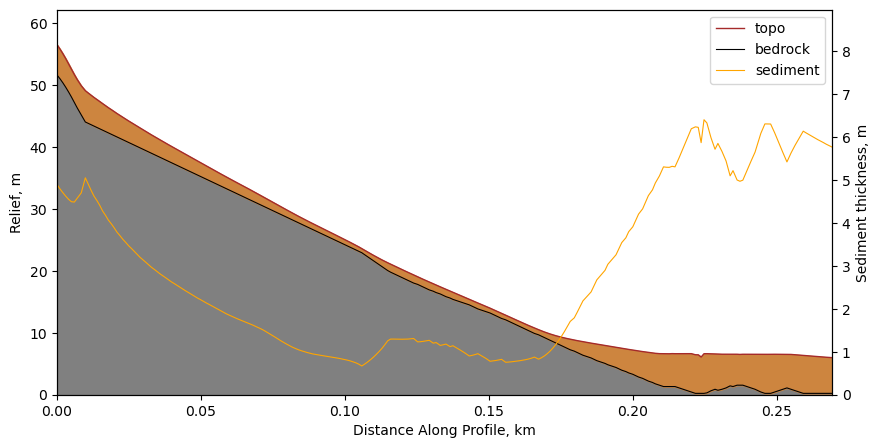

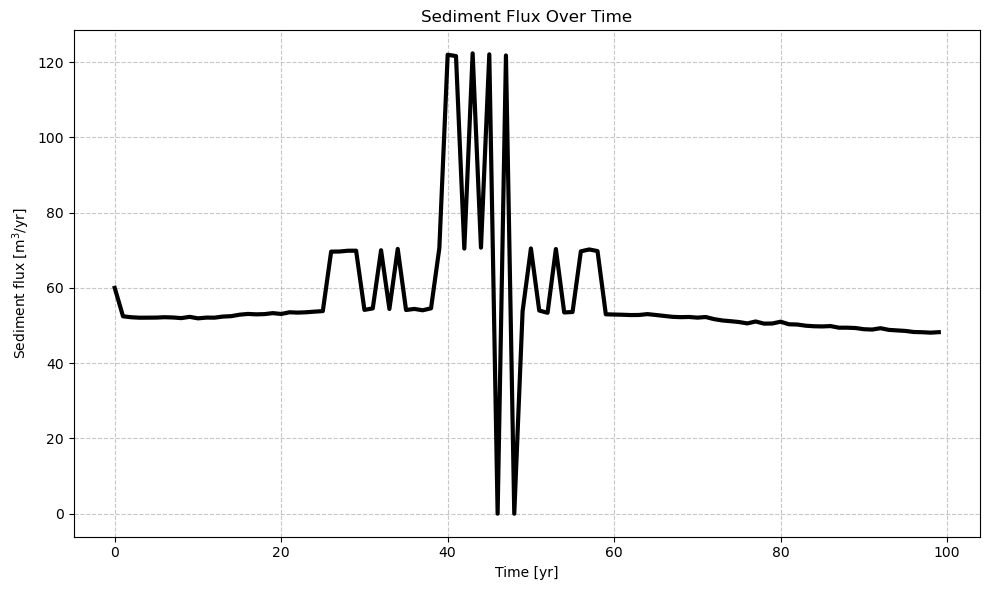

In [32]:
# Profiles with sediment
profiler = ChannelProfiler(sm.grid)
profiler.run_one_step()
fig, ax1 = plt.subplots(figsize=(10,5))
riv_nodes = profiler.nodes
sm.grid.at_node["bedrock_elevation"]=sm.grid.at_node["topographic__elevation"]-sm.grid.at_node["soil__depth"]
 
dist_atNodes=profiler.distance_along_profile[0]
el = sm.grid.at_node["topographic__elevation"][riv_nodes]
sd = sm.grid.at_node["soil__depth"][riv_nodes]
br = el- sd

 # Use ravel() to flatten el and br to 1D
el = el.ravel()
sd = sd.ravel()
br = br.ravel()
 
 # Calculate minimum elevation and relief
min_elevation = min(np.min(el), np.min(br), 0)
el_relief = el - min_elevation
br_relief = br - min_elevation
 
qs = sm.grid.at_node["sediment__flux"][riv_nodes]
qs[np.where(qs<10)] = np.nan
 
plt_fontsize =10
 
#fig, ax1 = plt.subplots(figsize=(5,3.7), dpi=400)
ax2 = ax1.twinx()
dist = (max(dist_atNodes)-dist_atNodes)*1e-3
 
brown_c = [205/255,133/255,63/255]
 
# Fill the entire area from max relief to 0
#ax1.fill_between(dist, np.max(el_relief), 0, color='lightgrey', label='total area')
 
# Fill the bedrtock and colluvial material relief
ax1.fill_between(dist, br_relief, 0, color='grey', label='bedrock')
ax1.fill_between(dist, el_relief, br_relief, color=brown_c, label='colluvial material')        
 
 # Plot bedrock and topographic relief
lns2 = ax1.plot(dist, br_relief, color='k', label='bedrock', linewidth=0.8, zorder=3)
lns1 = ax1.plot(dist, el_relief, color='brown', label='topo', linewidth=1, zorder=4)
 
 # set up labels
ax1.set_xlabel('Distance Along Profile, km', fontweight='normal', fontsize=plt_fontsize)
ax1.tick_params(labelsize=plt_fontsize)
ax1.set_ylabel('Relief, m', fontweight='normal', fontsize=plt_fontsize)
ax1.set_ylim((0, np.max(el_relief)*1.1))
 
 # plot sediment thickness
lns3 = ax2.plot(dist, sd, color='orange', label ='sediment', linewidth=0.8)
ax2.set_ylabel('Sediment thickness, m', fontweight='normal', fontsize=plt_fontsize)
ax2.set_ylim((0, np.nanmax(sd) * 1.4))
ax2.set_xlim((0, dist[2]))
ax2.tick_params(labelsize=plt_fontsize)
 
 # Merge legends
lns = lns1 + lns2 + lns3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, fontsize=plt_fontsize)

# Set y-axis to start from 0
ax1.set_ylim(bottom=0)
plt.show()

# Instantiate figure
fig = plt.figure(figsize=(10, 6))

# Instantiate subplot
sedfluxplot = plt.subplot()

# Create time array based on actual model timesteps
# Since you're using timestep=50 and have 10 points, create proper x-axis
time_values = np.arange(0, run_time, timestep)  # [0, 50, 100, 150, ..., 450]

# Plot data - now x and y will have the same length (10 elements)
sedfluxplot.plot(time_values, sed_flux, color="k", linewidth=3.0)

# Add axis labels
sedfluxplot.set_xlabel("Time [yr]")
sedfluxplot.set_ylabel(r"Sediment flux [m$^3$/yr]")

# Add grid for better readability
sedfluxplot.grid(True, linestyle='--', alpha=0.7)

# Add a title
sedfluxplot.set_title("Sediment Flux Over Time")

# Display the plot
plt.tight_layout()
plt.show()

## Step IV. Vegetation and Erodibility
As glacier retreats, a landscape may experience revegetation (based on local climate). Vegetation then plays a role in slablizing slopes against erosion. This section explores a slope-dependent vegetation diffusion scheme.

#### Define variables and functions

In [33]:
# k_sed = grid.add_ones("sediment_erodibility", at = "node")
slope = np.rad2deg(sm.grid.calc_slope_at_node(elevs=sm.grid.at_node['topographic__elevation'])) 
def calc_colonization_rate(slope):
    """ Function to reduce colonization rate on higher slopes. """
    max_slope = 20  # Maximum slope (in degrees)
    val = 0.0
    if slope > max_slope:
        val = 0.01  # Very low colonization on steep slopes
    else:
        val = 0.1  # Normal colonization rate
    # if grid.at_node["surface_water__depth"] < 0.1:
    #     val = 0.1
    # else:
    #     val = 0
    return val
    
# 2. Vegetation field (0 = bare, 1 = vegetated)
veg = sm.grid.add_zeros('node', 'vegetation__state', dtype=int, clobber=True)
veg[sm.grid.node_y < 5] = 1  # seed bottom 5 rows with vegetation
# Define erodibility values
def calc_erodibility(veg):
    """ Function to return erodibility based on vegetation state. """
    # High erodibility for non-vegetated cells and low erodibility for vegetated cells
    if veg == 1:
        return 0.005  # Lower erodibility for vegetated cells
    else:
        return 0.01  # Higher erodibility for non-vegetated cells
    
# 3. Parameters
d = 0.01  # disturbance probability
n_steps = 200

# 4. Define update function
def vegetation_ca_step(grid, veg, d, slope):
    new_veg = veg.copy()
    for node in grid.core_nodes:
        neighbors = grid.adjacent_nodes_at_node[node]
        if veg[node] == 0:
            # Calculate slope-based colonization rate
            # slope = np.rad2deg(grid.calc_slope_at_node(elevs=elev))  # For simplicity, you can use elevation directly for slope
            c = calc_colonization_rate(slope[node])
            # Colonization from neighbors
            if any(veg[n] == 1 for n in neighbors if n != -1):
                if np.random.rand() < c:
                    new_veg[node] = 1
        elif veg[node] == 1:
            # Disturbance/death
            if np.random.rand() < d:
                new_veg[node] = 0
    veg[:] = new_veg  # update in-place
    


/Users/vietbui/Documents/anaconda3/envs/ivy/lib/python3.11/site-packages/landlab/field/graph_field.py:1347: FutureWarning: Calling `add_empty` with the field location as the first argument is deprecated and will be removed in future versions. Instead, please use the `at` keyword to specify the location: add_empty(arg0, at='node').
  data = self.add_empty(*args, **kwds)


#### Run vegetation-erosion model showing final vegetation condition

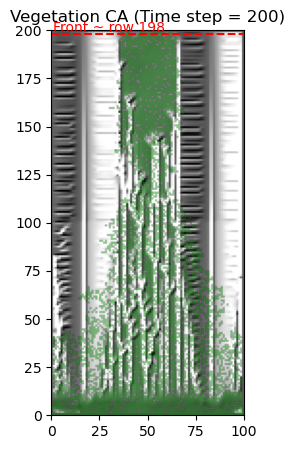

In [34]:
# 5. Time loop with plot every 10 steps

# save for animation
artists = []
fig, ax = plt.subplots(figsize=(6, 5))
for t in range(0, n_steps + 1, 10):
    for _ in range(100):
        vegetation_ca_step(sm.grid, veg, d, slope)
    
    veg_raster = sm.grid.node_vector_to_raster(veg)
    veg_mask = veg_raster == 1

    rgba_veg = np.zeros((*veg_raster.shape, 4))
    rgba_veg[veg_mask, 1] = 1
    rgba_veg[veg_mask, 3] = 0.9

    hsd = sm.grid.calc_hillshade_at_node(alt=45.0, az=315.0, slp=None, asp=None, unit='degrees', elevs='topographic__elevation')
    im_hillshade = ax.imshow(
        sm.grid.node_vector_to_raster(hsd),
        cmap="Greys",
        origin="lower",
        extent=(0, size_x, 0, size_y)
    )
    im_veg = ax.imshow(
        rgba_veg * [0, 0.5, 0, 1],
        extent=(0, size_x, 0, size_y),
        origin="lower",
        alpha=0.5,
    )
    # Annotate front row
    raster = sm.grid.node_vector_to_raster(veg)
    rows_with_veg = np.where(np.any(raster > 0, axis=1))[0]
    ax.set_title(f"Vegetation CA (Time step = {t})")
    if len(rows_with_veg) > 0:
        front_row = rows_with_veg[-1]
        line = ax.axhline(front_row, color='red', linestyle='--')
        text = ax.text(1, front_row + 1, f"Front ~ row {front_row}", color='red')
        artists.append([im_hillshade, im_veg, line, text])
    else:
        artists.append([im_hillshade, im_veg])

ani = animation.ArtistAnimation(fig, artists, interval=n_steps, blit=True)
HTML(ani.to_jshtml())

Plotting the vegetation overlapping with the topography

# Step pre-V. Ensembling All Elements into the Synthetic Model

We need to reset our model

In [35]:
sm.reset()

# add boundaries
sm.grid.status_at_node[sm.grid.nodes_at_left_edge] = sm.grid.BC_NODE_IS_CLOSED
sm.grid.status_at_node[sm.grid.nodes_at_right_edge] = sm.grid.BC_NODE_IS_CLOSED
# grid.status_at_node[grid.nodes_at_bottom_edge] = grid.BC_NODE_IS_CLOSED
sm.grid.status_at_node[sm.grid.nodes_at_top_edge] = sm.grid.BC_NODE_IS_CLOSED

In [36]:
# Instantiate Soil Diffusion component
#---------------------------------------
soil_production = sm.grid.add_zeros('soil_production__rate', at = 'node', clobber=True)
DDdiff = DepthDependentTaylorDiffuser(sm.grid, if_unstable="warn", dynamic_dt=True)

# Instantiate the ThawIce component
#---------------------------------------
melt = ThawIce(sm.grid)
melt.calc_thaw_rate(ice_thickness = sm.z_ice, soil_thickness = sm.z_soil)
melt.thaw(timestep_years = 1, thaw_days_per_year = 100)

# Setup for the FlowAccumulator component
#-------
np.random.seed(seed=5000) # to make the topography random consistent
sm.grid.at_node['topographic__elevation'] += np.random.uniform(0.0, 1.0, size=sm.grid.at_node['topographic__elevation'].shape)
sm.grid.set_watershed_boundary_condition_outlet_id(
    50 , sm.grid.at_node["topographic__elevation"], -9999.0
) # only allow the bottom center node to be an outlet
number_of_watersheds = 1 # constrain for only one watershed
minimum_channel_threshold=100
flow_metric = "D8"
phi_FR = 0.0
debris_thickness_rate = 0.08 # m/yr
# We establish the initial conditions for depth (empty)
h = sm.grid.add_zeros("surface_water__depth", at="node", clobber=True)
# Water velocity is zero in everywhere since there is no water yet
vel = sm.grid.add_zeros("surface_water__velocity", at="link", clobber=True)
# Calculating the initial water surface elevation from water depth and topographic elevation
wse = sm.grid.add_field("surface_water__elevation", sm.grid.at_node['topographic__elevation'], at="node", clobber=True)

# Instantiate the FlowAccumulator component
#---------------------------------------
fr = FlowAccumulator(sm.grid, flow_director="FlowDirectorD8")
df = DepressionFinderAndRouter(sm.grid)

# Setup for the OverlandFlow component
#-------
channel_w = 20. # set channel width, meters (PLAY WITH THIS VALUE!!)
channel_center = size_x/(2 * spacing)
channel_diff = channel_w/2
num_nodes = size_x * size_y / spacing - 1
node_channel_left = int(num_nodes - channel_center - channel_diff)-size_x
node_channel_right = int(num_nodes - channel_center + channel_diff)-size_x
# We set fixed boundary conditions, specifying the nodes and links in which the water is flowing into the grid
inlet_nodes = np.arange(math.floor(node_channel_left), math.ceil(node_channel_right), spacing).astype(int)
# We set the fixed values in the entry nodes/links
# constant_Q = 10000. # discharge value; m3/s (PLAY WITH THIS VALUE!!)
constant_Q_m3ps = 60. # stream discharge value; m3/s (PLAY WITH THIS VALUE!!)
sec_per_year = 60*60*24*365 # s/yr
constant_Q = constant_Q_m3ps * sec_per_year # discharge in m3/yr

Q_array = np.ones(len(inlet_nodes)) * constant_Q
# We set some other values
mannings_n = 0.05 # Mannings roughness

# Instantiate the OverlandFlow component
#---------------------------------------
of = OverlandFlow(sm.grid, steep_slopes=True)

In [37]:
# Setup for SPACE model
#--------
timestep = 1 # years
elapsed_time = 0.0 # years
count = 0
run_time = 200 # years
sed_flux = np.zeros(int(run_time // timestep)) # Adjusted size
node_next_to_outlet = 151

# Instantiate SPACE model with chosen parameters
#---------------------------------------
sp = Space(
    sm.grid,
    K_sed=0.01, # Sediment erodibility, Governs the rate of sediment entrainment; may be specified as a single floating point number, an array of length equal to the number of grid nodes, or a string naming an existing grid field.
    K_br=0.00001, # Bedrock erodibility, Governs the rate of bedrock erosion; may be specified as a single floating point number, an array of length equal to the number of grid nodes, or a string naming an existing grid field.
    F_f=0.0, # Fraction of fine sediment, (unitless, 0-1) fraction of rock that does not get converted to sediment but assumed to exit model domain as wash load
    phi=0.0, # Sediment porosity
    H_star=1.0, # Sediment entrainment length scale - think of reflecting bedrock surface roughness
    v_s=5.0, # Effective settling velocity
    m_sp=0.5, # Stream power exponent on drainage area or discharge in the stream power framework. Generally 0.5
    n_sp=1.0, # Stream power exponent n  on channel slope around 1
    sp_crit_sed=0, 
    sp_crit_br=0,
)

# Give the downward component of each inlet node a discharge corresponding to constant_Q
for n in inlet_nodes:
    links = sm.grid.links_at_node[n]  #links pointing dow
    sm.grid.at_link["surface_water__discharge"][links[3]] = constant_Q

# Set up the discharge as a function of time
discharge_list = np.arange(constant_Q, 0.556*(run_time+1) + constant_Q, 0.556*timestep)

In [38]:
# Instantiate Vegetation 
seeding_start_year = 20.0 # after the model has run for 10 years, colonization and seeding for vegetation will start
veg = sm.grid.add_zeros('node', 'vegetation__state', dtype=int, clobber=True)
d = 0.01  # disturbance probability

/Users/vietbui/Documents/anaconda3/envs/ivy/lib/python3.11/site-packages/landlab/field/graph_field.py:1347: FutureWarning: Calling `add_empty` with the field location as the first argument is deprecated and will be removed in future versions. Instead, please use the `at` keyword to specify the location: add_empty(arg0, at='node').
  data = self.add_empty(*args, **kwds)


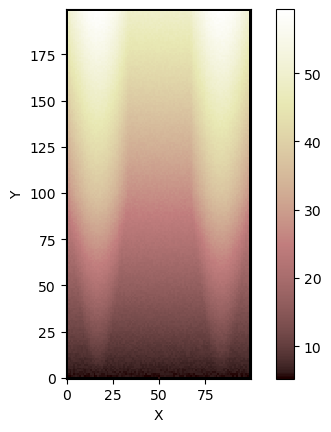

In [39]:
sm.grid.imshow(sm.grid.at_node['topographic__elevation'], )


With Apple M4, the next cell can take up more than 5 mins to run.

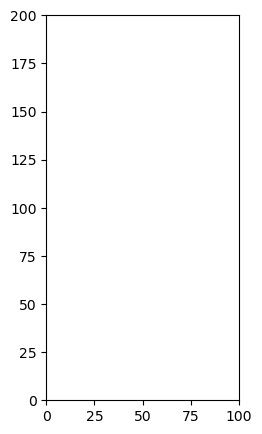

In [40]:
artists =[]
fig, ax = plt.subplots(figsize=(4, 5))
skip_by = 8.0
slope = np.rad2deg(sm.grid.calc_slope_at_node(elevs=sm.grid.at_node['topographic__elevation'])) 
title = ax.set_title(u"Moraine Evolution (Year = {})".format(elapsed_time))
thaw_rate_ls = []
while elapsed_time < run_time:
    if elapsed_time == seeding_start_year:
        veg[sm.grid.node_y < 2] = 1  # seed bottom 2 rows with vegetation
    if elapsed_time >= seeding_start_year:
        slope = np.rad2deg(sm.grid.calc_slope_at_node(elevs=sm.grid.at_node['topographic__elevation'])) 
        for _ in range(100):
            vegetation_ca_step(sm.grid, veg, d, slope)
        
        if elapsed_time % skip_by == 0:
            title = ax.set_title(u"Moraine Evolution (Year = {})".format(elapsed_time))
            year_text = ax.text(1,100, f"Year ~ {elapsed_time}", color='red')   
            veg_raster = sm.grid.node_vector_to_raster(veg)
            veg_mask = veg_raster == 1
            rgba_veg = np.zeros((*veg_raster.shape, 4))
            rgba_veg[veg_mask, 1] = 1
            rgba_veg[veg_mask, 3] = 0.9

            hsd = sm.grid.calc_hillshade_at_node(alt=45.0, az=315.0, slp=None, asp=None, unit='degrees', elevs='topographic__elevation')
            im_hillshade = ax.imshow(
                sm.grid.node_vector_to_raster(hsd),
                cmap="Greys",
                origin="lower",
                extent=(0, size_x, 0, size_y)
            )
            im_veg = ax.imshow(
                rgba_veg * [0, 0.5, 0, 1],
                extent=(0, size_x, 0, size_y),
                origin="lower",
                alpha=0.5,
            )
            # Annotate front row
            raster = sm.grid.node_vector_to_raster(veg)
            rows_with_veg = np.where(np.any(raster > 0, axis=1))[0]
            if len(rows_with_veg) > 0:
                front_row = rows_with_veg[-1]
                line = ax.axhline(front_row, color='red', linestyle='--')
                text = ax.text(1, front_row + 1, f"Front ~ row {front_row}", color='red')
                artists.append([im_hillshade, im_veg, line, text, title, year_text])
            else:
                artists.append([im_hillshade, im_veg, title, year_text])
            # plt.show()
    else:
        if elapsed_time % skip_by == 0:
            title = ax.set_title(u"Moraine Evolution (Year = {})".format(elapsed_time))
            year_text = ax.text(1,100, f"Year ~ {elapsed_time}", color='red')
            hsd = sm.grid.calc_hillshade_at_node(alt=45.0, az=315.0, slp=None, asp=None, unit='degrees', elevs='topographic__elevation')
            im_hillshade = ax.imshow(
                sm.grid.node_vector_to_raster(hsd),
                cmap="Greys",
                origin="lower",
                extent=(0, size_x, 0, size_y)
            )
            # title = ax.set_title(f"Moraine Evolution (Year = {elapsed_time:.2f})")
            artists.append([im_hillshade, title, year_text])
    # Run diffusion then update topography
    # if elapsed_time % 10 == 0:
    #     DDdiff.run_one_step(1)
    #     sm.grid.at_node['topographic__elevation'] += np.random.uniform(0.0, 1.0, size=sm.grid.at_node['topographic__elevation'].shape)
    # DDdiff.run_one_step(1)
    # Run the flow router
    fr.run_one_step()
    # Run the depression finder and router
    df.map_depressions()
    # Run SPACE for one time step
    sp.run_one_step(dt=timestep)
    # Run overland flow
    of.run_one_step()
    for n in inlet_nodes:
        links = sm.grid.links_at_node[n]  #links pointing down
        sm.grid.at_link["surface_water__discharge"][links[3]] = discharge_list[count+1]
    sed_flux[count] = sm.grid.at_node["sediment__flux"][node_next_to_outlet]
    # random mound generation
    create_parabolic_mound(
        x_center=np.random.uniform(30, 50), 
        y_center=np.random.uniform(125, 199), 
        radius=np.random.uniform(1,20), 
        depth_peak=np.random.uniform(0.01,0.08)
    )
    create_parabolic_mound(
        x_center=np.random.uniform(50, 70), 
        y_center=np.random.uniform(125, 199), 
        radius=np.random.uniform(1,20), 
        depth_peak=np.random.uniform(0.01,0.08)
    )
    # run the thawing process
    melt.calc_thaw_rate(ice_thickness = sm.grid.at_node['ice__elevation'], soil_thickness = sm.grid.at_node['soil__depth'])
    melt.thaw(timestep_years = 1, thaw_days_per_year = 100)
    
    # update topography
    sm.grid.at_node['ice__elevation'] = melt.ice_thickness
    # Update the ice thickness in the grid
    sm.grid.at_node["soil__depth"][:] = melt.soil_thickness
    sm.grid.at_node["bedrock__elevation"] = sm.z_bed + sm.grid.at_node["ice__elevation"]
    sm.grid.at_node["topographic__elevation"] = sm.grid.at_node['bedrock__elevation'] + sm.grid.at_node["soil__depth"]
    
    elapsed_time += timestep
    
    count += 1
    # Print progress
    # print(f"Elapsed time: {elapsed_time:.2f} years, Sediment flux: {sed_flux[count-1]:.2f} m^3/yr")
    # print(f'The maximum thaw rate is', max(melt.thaw_rate), 'cm/day')
    thaw_rate_ls.append(max(melt.thaw_rate))


ani = animation.ArtistAnimation(fig, artists, interval=n_steps, blit=False)
HTML(ani.to_jshtml())

### Check for max thaw rate recorded over the entire model run

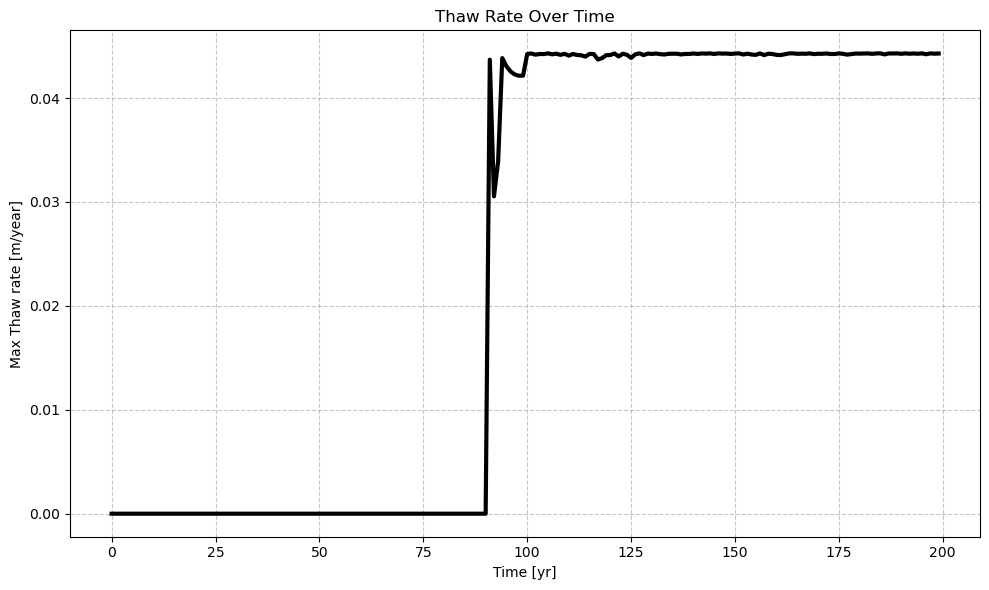

In [41]:
# Plot the thaw rate
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(np.arange(0, run_time, timestep), thaw_rate_ls, color="k", linewidth=3.0)
ax.set_xlabel("Time [yr]")
ax.set_ylabel("Max Thaw rate [m/year]")
ax.set_title("Thaw Rate Over Time")
ax.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

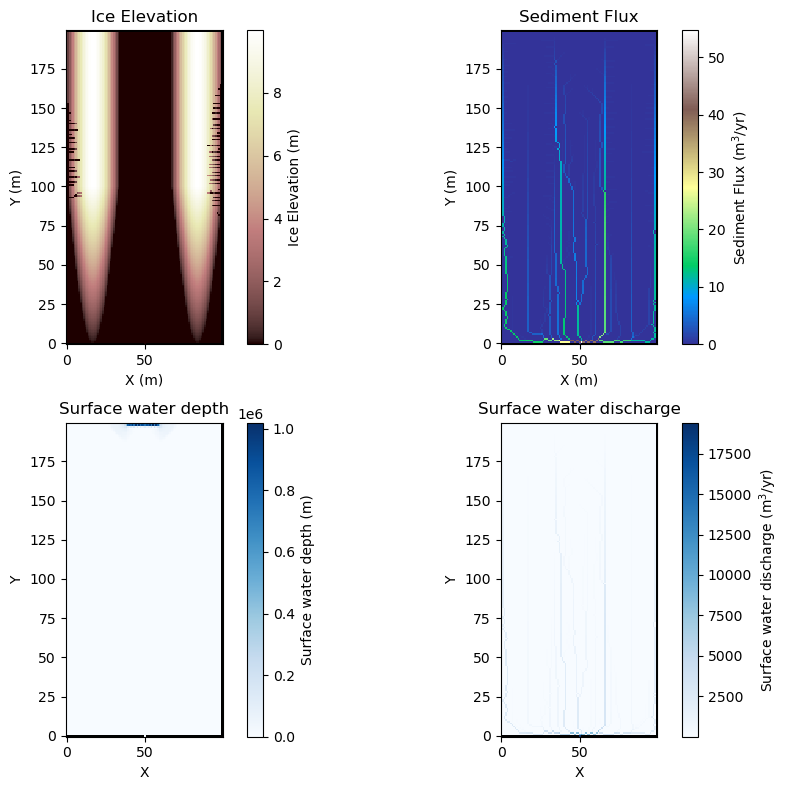

In [42]:

# Create a figure with 1 row and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Plot topographic elevation in the first subplot
plt.sca(axes[0,0])  # Set the current axis to the first subplot
imshow_grid(
    sm.grid,
    "ice__elevation",
    plot_name="Ice Elevation",
    var_name="Ice Elevation",
    var_units="m",
    grid_units=("m", "m"),
    color_for_closed='black',
)

# Plot sediment flux in the second subplot
plt.sca(axes[0,1])  # Set the current axis to the second subplot
imshow_grid(
    sm.grid,
    "sediment__flux",
    plot_name="Sediment Flux",
    var_name="Sediment Flux",
    var_units=r"m$^3$/yr",
    grid_units=("m", "m"),
    cmap="terrain",
)

plt.sca(axes[1,0])  # Set the current axis to the third subplot
imshow_grid(
    sm.grid,
    'surface_water__depth',
    plot_name="Surface water depth",
    var_name="Surface water depth",
    cmap="Blues",
    var_units="m",
)
plt.sca(axes[1,1])  # Set the current axis to the third subplot
imshow_grid(
    of.grid,
    'surface_water__discharge',
    plot_name="Surface water discharge",
    var_name="Surface water discharge",
    cmap="Blues",
    var_units="m$^3$/yr",
)

plt.tight_layout()
plt.show()


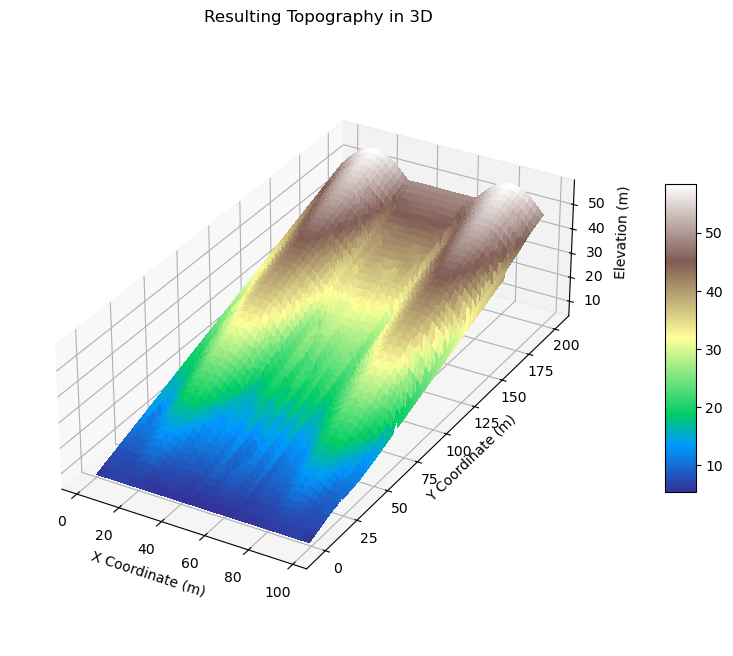

In [43]:

#3D plot the topography
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(0, sm.size_x, sm.spacing), np.arange(0, sm.size_y, sm.spacing))
Z = sm.grid.at_node['topographic__elevation'].reshape(sm.size_y, sm.size_x)

# Limit the x domain from 33.33 to 66.67
# x_mask = (X[0, :] >= 16.67) & (X[0, :] <= 83.33)
# X = X[:, x_mask]
# Y = Y[:, x_mask]
# Z = Z[:, x_mask]
ax.set_box_aspect((1, sm.size_y/sm.size_x, sm.grid.at_node['topographic__elevation'].max()/sm.size_x))  # Aspect ratio is 1:1:0.5
ax.plot_surface(X, Y, Z, cmap='terrain', edgecolor='none')
ax.set_xlabel('X Coordinate (m)')
ax.set_ylabel('Y Coordinate (m)')
ax.set_zlabel('Elevation (m)')
ax.set_title('Resulting Topography in 3D')
fig.colorbar(ax.plot_surface(X, Y, Z, cmap='terrain', linewidth=0, antialiased=False), ax=ax, shrink=0.5, aspect=10)

plt.show()

## Step V. Combining the Elements into a Scaled Model
<div>
<img src="media/Kviarjokull.PNG" width="600" hspace="20">
</div>
Kviarjokull System in Southeast Iceland


#### Define grid using natural topography and plot current state

In [64]:

file_path = 'data/Kviarjokull_rotate_8_831m.csv'

# Read the CSV file
data = pd.read_csv(file_path, header=None)
spacing = 8.8 #meters
soil_thickness = 5.0
size_x = len(data.columns)
size_y = len(data.index)
grid = RasterModelGrid((size_y, size_x), xy_spacing=spacing)

# getting DEM topography
dem_ice = grid.add_zeros('ice__elevation', at='node', clobber=True)
dem_soil = grid.add_zeros('soil__depth', at='node', clobber=True)
dem_bed = grid.add_zeros('bedrock__elevation', at='node', clobber=True)
grid.add_zeros('topographic__elevation', at='node', clobber=True)

array([0., 0., 0., ..., 0., 0., 0.])

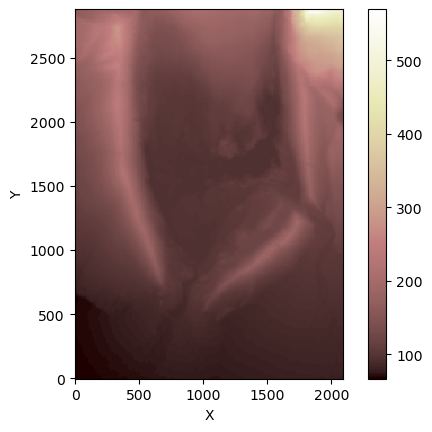

In [65]:
dem_z = data.iloc[::-1, ::].values.flatten()
grid.at_node['topographic__elevation'] = dem_z
grid.imshow(grid.at_node['topographic__elevation'], )

In [66]:
topo_green_elevation = np.where((grid.at_node['topographic__elevation'] >= 140) & (grid.at_node['topographic__elevation'] <= 350))[0]
topo_green_elevation

array([19407, 19408, 19647, ..., 78019, 78020, 78021])

Text(0.5, 1.0, 'Ice Elevation')

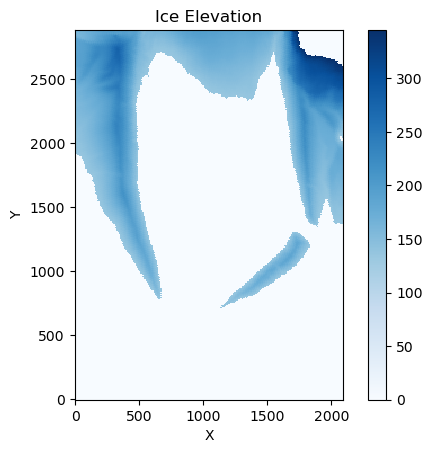

In [67]:
dem_ice[topo_green_elevation] += grid.at_node['topographic__elevation'][topo_green_elevation] - soil_thickness
grid.imshow(grid.at_node['ice__elevation'], cmap='Blues')
plt.title('Ice Elevation')

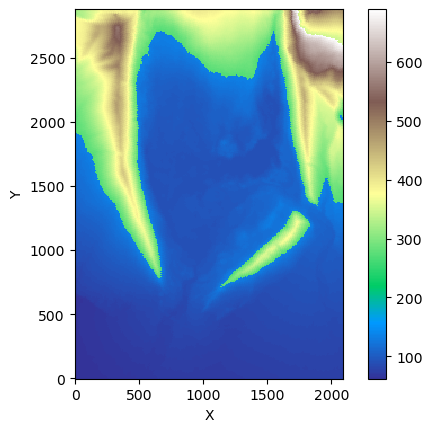

In [68]:
dem_bed = grid.at_node['topographic__elevation'] - soil_thickness
grid.at_node['bedrock__elevation'] = dem_bed + grid.at_node['ice__elevation']
grid.imshow(grid.at_node['bedrock__elevation'], cmap='terrain')

Text(0.5, 1.0, 'Soil Depth')

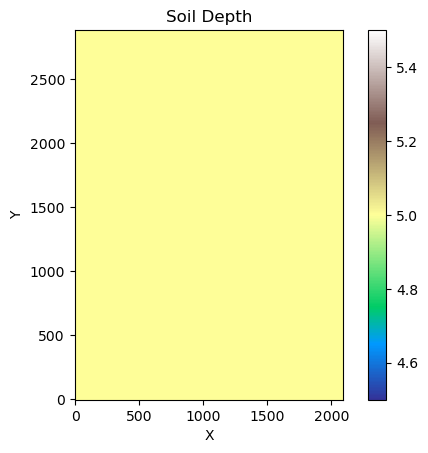

In [69]:
grid.at_node['soil__depth'] += soil_thickness
grid.imshow(grid.at_node['soil__depth'], cmap='terrain')
plt.title('Soil Depth')

#### Initialize Functions

In [70]:
# Instantiate the ThawIce component
#---------------------------------------
melt = ThawIce(grid)
melt.calc_thaw_rate(ice_thickness = dem_ice, soil_thickness = dem_soil)
melt.thaw(timestep_years = 1, thaw_days_per_year = 100)

# Setup for the FlowAccumulator component
#-------
np.random.seed(seed=5000) # to make the topography random consistent
# grid.at_node['topographic__elevation'] += np.random.uniform(0.0, 1.0, size=sm.grid.at_node['topographic__elevation'].shape)
grid.set_watershed_boundary_condition_outlet_id(
    600 , grid.at_node["topographic__elevation"], -9999.0
) # only allow the bottom center node to be an outlet
number_of_watersheds = 1 # constrain for only one watershed
minimum_channel_threshold=100
flow_metric = "D8"
phi_FR = 0.0
debris_thickness_rate = 0.08 # m/yr
# We establish the initial conditions for depth (empty)
h = grid.add_zeros("surface_water__depth", at="node", clobber=True)
# Water velocity is zero in everywhere since there is no water yet
vel = grid.add_zeros("surface_water__velocity", at="link", clobber=True)
# Calculating the initial water surface elevation from water depth and topographic elevation
wse = grid.add_field("surface_water__elevation", grid.at_node['topographic__elevation'], at="node", clobber=True)

# Instantiate the FlowAccumulator component
#---------------------------------------
fr = FlowAccumulator(grid, flow_director="FlowDirectorD8")
df = DepressionFinderAndRouter(grid)
# Add overland flow parameters to lowest 10% of upstream elevations in penultimate row
num_nodes = size_x * size_y / spacing - 1
top_row = grid.nodes_at_top_edge
penultimate_row = np.arange(top_row[1] - 1 - len(top_row), top_row[1] - 1, 1)
penultimate_elevs = grid.at_node["topographic__elevation"][penultimate_row]
inlet_threshold = np.percentile(penultimate_elevs, 10)
below_threshold_nodes = []
for i, index  in enumerate(penultimate_row):
    if penultimate_elevs[i] < inlet_threshold:
        below_threshold_nodes.append(int(index))
# Give the downward component of each inlet node an initial discharge corresponding to constant_Q
# constant_Q = 60. # discharge value; m3/s (PLAY WITH THIS VALUE!!)
constant_Q_m3ps = 60. # stream discharge value; m3/s (PLAY WITH THIS VALUE!!)
sec_per_year = 60*60*24*365 # s/yr
constant_Q = constant_Q_m3ps * sec_per_year # discharge in m3/yr

Q_array = np.ones(len(below_threshold_nodes)) * constant_Q
mannings_n = 0.05 # Mannings roughness

# Instantiate the OverlandFlow component
#---------------------------------------
of = OverlandFlow(grid, steep_slopes=True)
# Setup for SPACE model
#--------
timestep = 1 # years
elapsed_time = 0.0 # years
count = 0
run_time = 20 # years
sed_flux = np.zeros(int(run_time // timestep)) # Adjusted size
node_next_to_outlet = int(600 + grid.number_of_node_columns*spacing - 1)
print(node_next_to_outlet)

# Instantiate SPACE model with chosen parameters
#---------------------------------------
sp = Space(
    grid,
    K_sed=0.01, # Sediment erodibility, Governs the rate of sediment entrainment; may be specified as a single floating point number, an array of length equal to the number of grid nodes, or a string naming an existing grid field.
    K_br=0.00001, # Bedrock erodibility, Governs the rate of bedrock erosion; may be specified as a single floating point number, an array of length equal to the number of grid nodes, or a string naming an existing grid field.
    F_f=0.0, # Fraction of fine sediment, (unitless, 0-1) fraction of rock that does not get converted to sediment but assumed to exit model domain as wash load
    phi=0.0, # Sediment porosity
    H_star=1.0, # Sediment entrainment length scale - think of reflecting bedrock surface roughness
    v_s=5.0, # Effective settling velocity
    m_sp=0.5, # Stream power exponent on drainage area or discharge in the stream power framework. Generally 0.5
    n_sp=1.0, # Stream power exponent n  on channel slope around 1
    sp_crit_sed=0, 
    sp_crit_br=0,
)

# Give the downward component of each inlet node a discharge corresponding to constant_Q
for n in inlet_nodes:
    links = grid.links_at_node[n]  #links pointing dow
    grid.at_link["surface_water__discharge"][links[3]] = constant_Q

# Set up the discharge as a function of time
discharge_list = np.arange(constant_Q, 0.556*(run_time+1) + constant_Q, 0.556*timestep)

2693


In [71]:
# Instantiate Vegetation 
seeding_start_year = 10.0 # after the model has run for 10 years, colonization and seeding for vegetation will start
veg = grid.add_zeros('node', 'vegetation__state', dtype=int, clobber=True)
d = 0.01  # disturbance probability

/Users/vietbui/Documents/anaconda3/envs/ivy/lib/python3.11/site-packages/landlab/field/graph_field.py:1347: FutureWarning: Calling `add_empty` with the field location as the first argument is deprecated and will be removed in future versions. Instead, please use the `at` keyword to specify the location: add_empty(arg0, at='node').
  data = self.add_empty(*args, **kwds)


Text(0.5, 1.0, 'Topography')

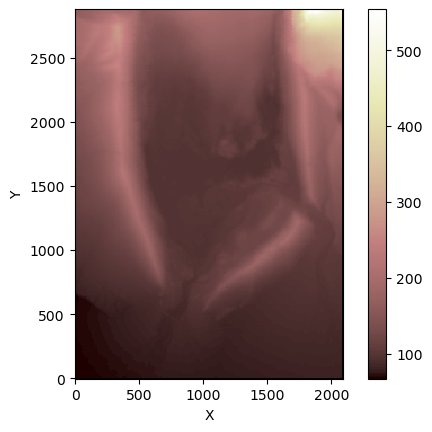

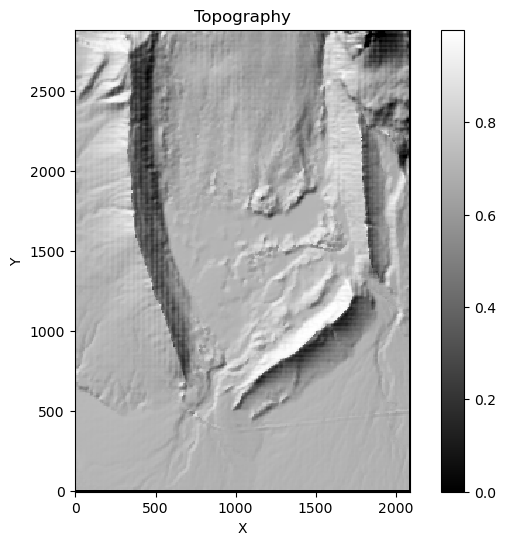

In [72]:
grid.imshow(grid.at_node['topographic__elevation'], )
hsd = grid.calc_hillshade_at_node(alt=45.0, az=315.0, slp=None, asp=None, unit='degrees', elevs='topographic__elevation')
plt.figure(figsize=(8, 6))
grid.imshow(hsd, cmap='gray')
plt.title('Topography')


#### LOOP THROUGH MORPHODYNAMIC FUNCTIONS HERE:

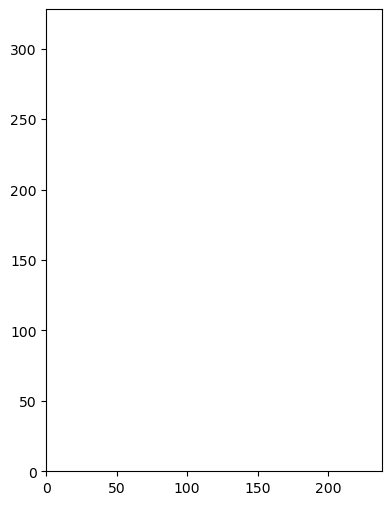

In [73]:
artists =[]
fig, ax = plt.subplots(figsize=(6, 6))
skip_by = 1
slope = np.rad2deg(grid.calc_slope_at_node(elevs=grid.at_node['topographic__elevation'])) 
title = ax.set_title(u"Moraine Evolution (Year = {})".format(elapsed_time))
thaw_rate_ls = []
while elapsed_time < run_time:
    if elapsed_time == seeding_start_year:
        veg[grid.node_y < 5] = 1  # seed bottom 2 rows with vegetation
    if elapsed_time >= seeding_start_year:
        slope = np.rad2deg(grid.calc_slope_at_node(elevs=grid.at_node['topographic__elevation'])) 
        for _ in range(100):
            vegetation_ca_step(grid, veg, d, slope)

        if elapsed_time % skip_by == 0:
            title = ax.set_title(u"Moraine Evolution (Year = {})".format(elapsed_time))
            year_text = ax.text(1,100, f"Year ~ {elapsed_time}", color='red')
            veg_raster = grid.node_vector_to_raster(veg)
            veg_mask = veg_raster == 1
            rgba_veg = np.zeros((*veg_raster.shape, 4))
            rgba_veg[veg_mask, 1] = 1
            rgba_veg[veg_mask, 3] = 0.9

            hsd = grid.calc_hillshade_at_node(alt=45.0, az=315.0, slp=None, asp=None, unit='degrees', elevs='topographic__elevation')
            im_hillshade = ax.imshow(
                grid.node_vector_to_raster(hsd),
                cmap="Greys",
                origin="lower",
                extent=(0, size_x, 0, size_y)
            )
            im_veg = ax.imshow(
                rgba_veg * [0, 0.5, 0, 1],
                extent=(0, size_x, 0, size_y),
                origin="lower",
                alpha=0.5,
            )
            # Annotate front row
            raster = grid.node_vector_to_raster(veg)
            rows_with_veg = np.where(np.any(raster > 0, axis=1))[0]
            if len(rows_with_veg) > 0:
                front_row = rows_with_veg[-1]
                line = ax.axhline(front_row, color='red', linestyle='--')
                text = ax.text(1, front_row + 1, f"Front ~ row {front_row}", color='red')
                artists.append([im_hillshade, im_veg, line, text, title, year_text])
            else:
                artists.append([im_hillshade, im_veg, title, year_text])
            # plt.show()
    else:
        if elapsed_time % skip_by == 0:
            title = ax.set_title(u"Moraine Evolution (Year = {})".format(elapsed_time))
            year_text = ax.text(1,100, f"Year ~ {elapsed_time}", color='red')
            hsd = grid.calc_hillshade_at_node(alt=45.0, az=315.0, slp=None, asp=None, unit='degrees', elevs='topographic__elevation')
            im_hillshade = ax.imshow(
                grid.node_vector_to_raster(hsd),
                cmap="Greys",
                origin="lower",
                extent=(0, size_x, 0, size_y)
            )
            # title = ax.set_title(f"Moraine Evolution (Year = {elapsed_time:.2f})")
            artists.append([im_hillshade, title, year_text])
    # Run diffusion then update topography
    # if elapsed_time % 10 == 0:
    #     DDdiff.run_one_step(1)
    #     grid.at_node['topographic__elevation'] += np.random.uniform(0.0, 1.0, size=grid.at_node['topographic__elevation'].shape)
    # DDdiff.run_one_step(1)
    # Run the flow router
    fr.run_one_step()
    # Run the depression finder and router
    df.map_depressions()
    # Run SPACE for one time step
    sp.run_one_step(dt=timestep)
    # Run overland flow
    of.run_one_step()
    for n in inlet_nodes:
        links = grid.links_at_node[n]  #links pointing down
        grid.at_link["surface_water__discharge"][links[3]] = discharge_list[count+1]
    sed_flux[count] = grid.at_node["sediment__flux"][node_next_to_outlet]
    # random mound generation
    create_parabolic_mound(
        x_center=np.random.uniform(540, 1600), 
        y_center=np.random.uniform(2500, 3170), 
        radius=np.random.uniform(20,100), 
        depth_peak=np.random.uniform(0.01,2)
    )

    # run the thawing process
    melt.calc_thaw_rate(ice_thickness = grid.at_node['ice__elevation'], soil_thickness = grid.at_node['soil__depth'])
    melt.thaw(timestep_years = 1, thaw_days_per_year = 100)
    
    # update topography
    grid.at_node['ice__elevation'] = melt.ice_thickness
    # Update the ice thickness in the grid
    grid.at_node["soil__depth"][:] = melt.soil_thickness
    grid.at_node["bedrock__elevation"] = dem_bed + grid.at_node["ice__elevation"]
    grid.at_node["topographic__elevation"] = grid.at_node['bedrock__elevation'] + grid.at_node["soil__depth"]
    
    elapsed_time += timestep
    
    count += 1
    # Print progress
    # print(f"Elapsed time: {elapsed_time:.2f} years, Sediment flux: {sed_flux[count-1]:.2f} m^3/yr")
    # print(f'The maximum thaw rate is', max(melt.thaw_rate), 'cm/day')
    thaw_rate_ls.append(max(melt.thaw_rate))


ani = animation.ArtistAnimation(fig, artists, interval=n_steps, blit=False)
HTML(ani.to_jshtml())

#### Plot the final topography and sediment flux through time

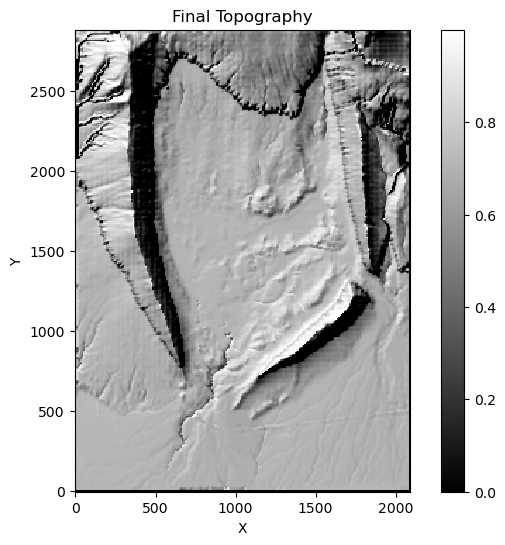

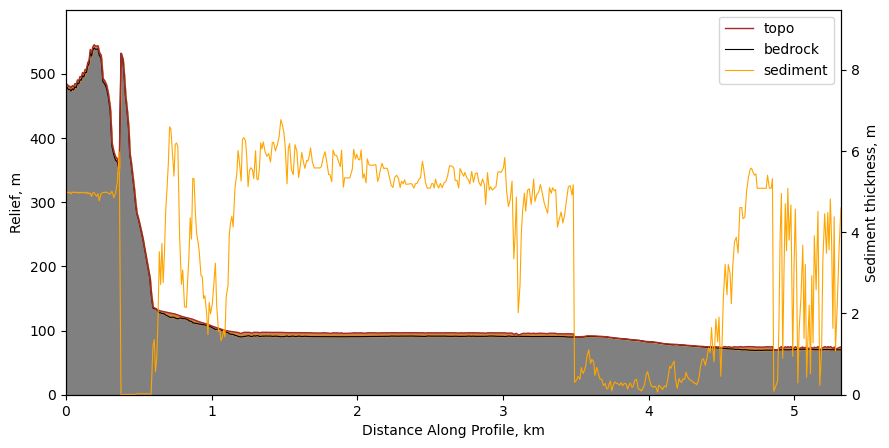

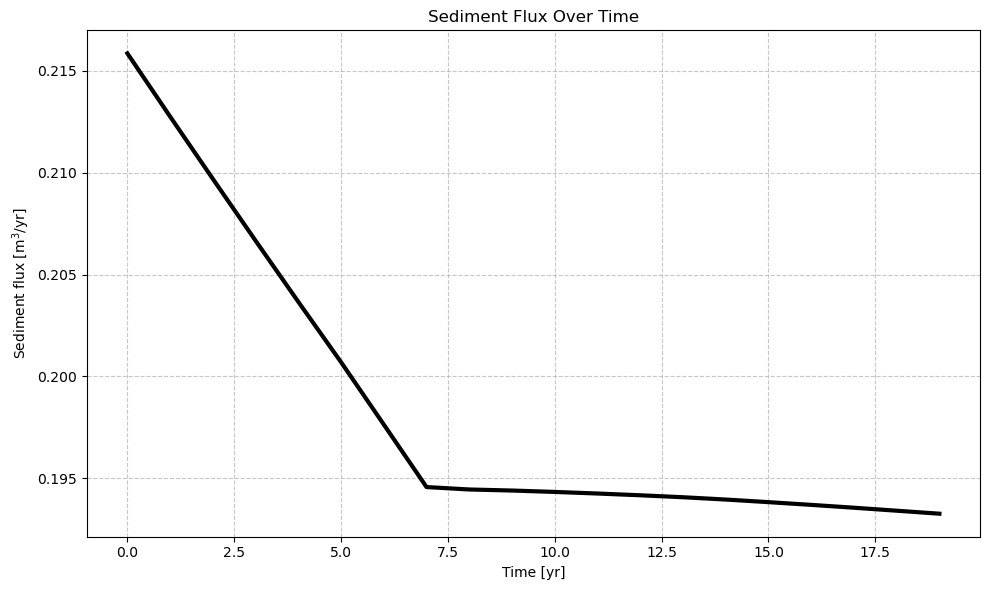

In [74]:
hsd = grid.calc_hillshade_at_node(alt=45.0, az=315.0, slp=None, asp=None, unit='degrees', elevs='topographic__elevation')
plt.figure(figsize=(8, 6))
grid.imshow(hsd, cmap='gray')
plt.title('Final Topography')

# Profiles with sediment
profiler = ChannelProfiler(grid)
profiler.run_one_step()
fig, ax1 = plt.subplots(figsize=(10,5))
riv_nodes = profiler.nodes
grid.at_node["bedrock_elevation"]=grid.at_node["topographic__elevation"]-grid.at_node["soil__depth"]
 
dist_atNodes=profiler.distance_along_profile[0]
el = grid.at_node["topographic__elevation"][riv_nodes]
sd = grid.at_node["soil__depth"][riv_nodes]
br = el- sd

 # Use ravel() to flatten el and br to 1D
el = el.ravel()
sd = sd.ravel()
br = br.ravel()
 
 # Calculate minimum elevation and relief
min_elevation = min(np.min(el), np.min(br), 0)
el_relief = el - min_elevation
br_relief = br - min_elevation
 
qs = grid.at_node["sediment__flux"][riv_nodes]
qs[np.where(qs<10)] = np.nan
 
plt_fontsize =10
 
#fig, ax1 = plt.subplots(figsize=(5,3.7), dpi=400)
ax2 = ax1.twinx()
dist = (max(dist_atNodes)-dist_atNodes)*1e-3
 
brown_c = [205/255,133/255,63/255]
 
# Fill the entire area from max relief to 0
#ax1.fill_between(dist, np.max(el_relief), 0, color='lightgrey', label='total area')
 
# Fill the bedrtock and colluvial material relief
ax1.fill_between(dist, br_relief, 0, color='grey', label='bedrock')
ax1.fill_between(dist, el_relief, br_relief, color=brown_c, label='colluvial material')        
 
 # Plot bedrock and topographic relief
lns2 = ax1.plot(dist, br_relief, color='k', label='bedrock', linewidth=0.8, zorder=3)
lns1 = ax1.plot(dist, el_relief, color='brown', label='topo', linewidth=1, zorder=4)
 
 # set up labels
ax1.set_xlabel('Distance Along Profile, km', fontweight='normal', fontsize=plt_fontsize)
ax1.tick_params(labelsize=plt_fontsize)
ax1.set_ylabel('Relief, m', fontweight='normal', fontsize=plt_fontsize)
ax1.set_ylim((0, np.max(el_relief)*1.1))
 
 # plot sediment thickness
lns3 = ax2.plot(dist, sd, color='orange', label ='sediment', linewidth=0.8)
ax2.set_ylabel('Sediment thickness, m', fontweight='normal', fontsize=plt_fontsize)
ax2.set_ylim((0, np.nanmax(sd) * 1.4))
ax2.set_xlim((0, dist[2]))
ax2.tick_params(labelsize=plt_fontsize)
 
 # Merge legends
lns = lns1 + lns2 + lns3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, fontsize=plt_fontsize)

# Set y-axis to start from 0
ax1.set_ylim(bottom=0)
plt.show()

# Instantiate figure
fig = plt.figure(figsize=(10, 6))

# Instantiate subplot
sedfluxplot = plt.subplot()

# Create time array based on actual model timesteps
# Since you're using timestep=50 and have 10 points, create proper x-axis
time_values = np.arange(0, run_time, timestep)  # [0, 50, 100, 150, ..., 450]

# Plot data - now x and y will have the same length (10 elements)
sedfluxplot.plot(time_values, sed_flux, color="k", linewidth=3.0)

# Add axis labels
sedfluxplot.set_xlabel("Time [yr]")
sedfluxplot.set_ylabel(r"Sediment flux [m$^3$/yr]")

# Add grid for better readability
sedfluxplot.grid(True, linestyle='--', alpha=0.7)

# Add a title
sedfluxplot.set_title("Sediment Flux Over Time")

# Display the plot
plt.tight_layout()
plt.show()

## Summary

This document forms a simple basis, or starting point, for upscaling these results to a natural system in an arctic or alpine deglaciated valley.

### References

    Brook, M. S., & Paine, S. (2012). Ablation of ice‐cored moraine in a humid, maritime climate: Fox Glacier, New Zealand. Geografiska Annaler: Series A, Physical Geography, 94(3), 339-349.

    Church, M., & Ryder, J. M. (1972). Paraglacial sedimentation: a consideration of fluvial processes conditioned by glaciation. Geological Society of America Bulletin, 83(10), 3059-3072.
    
    Kavan, J., Stuchlík, R., Carrivick, J. L., Hanáček, M., Stringer, C. D., Roman, M., ... & Nývlt, D. (2024). Proglacial lake evolution coincident with glacier dynamics in the frontal zone of Kvíárjökull, South‐East Iceland. Earth Surface Processes and Landforms, 49(5), 1487-1502. https://doi.org/10.1002/esp.5781

    Nicholson, L., & Benn, D. I. (2006). Calculating ice melt beneath a debris layer using meteorological data. Journal of Glaciology, 52(178), 463-470. https://doi.org/10.3189/172756506781828584

    Østrem, G. (1959). Ice melting under a thin layer of moraine, and the existence of ice cores in moraine ridges. Geografiska Annaler, 41(4), 228-230. https://www.jstor.org/stable/4626805

    Richardson, S. D., & Reynolds, J. M. (2000). Degradation of ice-cored moraine dams: implications for hazard development. IAHS PUBLICATION, 187-198.

    Schomacker, A., & Kjær, K. H. (2008). Quantification of dead‐ice melting in ice‐cored moraines at the high‐Arctic glacier Holmströmbreen, Svalbard. Boreas, 37(2), 211-225.

    Śledź, S., Ewertowski, M. W., & Evans, D. J. (2023). Quantification of short‐term transformations of proglacial landforms in a temperate, debris‐charged glacial landsystem, Kvíárjökull, Iceland. Land Degradation & Development, 34(17), 5566-5590. https://doi.org/10.1002/ldr.4865

    Sletten, K., Lyså, A., & Lønne, I. (2001). Formation and disintegration of a high‐arctic ice‐cored moraine complex, Scott Turnerbreen, Svalbard. Boreas, 30(4), 272-284.https://doi.org/10.1111/j.1502-3885.2001.tb01046.x

    Westoby, M. J., Glasser, N. F., Brasington, J., Hambrey, M. J., Quincey, D. J., & Reynolds, J. M. (2014). Modelling outburst floods from moraine-dammed glacial lakes. Earth-Science Reviews, 134, 137-159. https://doi.org/10.1016/j.earscirev.2014.03.009

    van Woerkom, T., Steiner, J. F., Kraaijenbrink, P. D., Miles, E. S., & Immerzeel, W. W. (2019). Sediment supply from lateral moraines to a debris-covered glacier in the Himalaya. Earth Surface Dynamics, 7(2), 411-427. https://doi.org/10.5194/esurf-7-411-2019